        Disable GPU: Force tensorflow to select CPU

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="-1"    
import tensorflow as tf

2025-06-16 21:03:56.713635: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750088036.734402  826023 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750088036.740597  826023 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-06-16 21:03:56.761547: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


        Select a GPU with a memory limit

In [2]:
# # include ../dirx 
mylibpath = [
    # '/home/kishor/src/FastDWTConvLayers',
    # '/home/kishor/src/MRSegmentation/Attentions19102023'
      # '/home/k/src/_MEDCNNsrc_part/MEDCNN_copy'
      '/home/kishoretarafdar/bin'
      # '/home/kishor/src/MEDCNN_copy'
    #'/home/k/PLAYGROUND10GB/SKULSTRIPpaper__'
    ]
import sys
[sys.path.insert(0,_) for _ in mylibpath]
del mylibpath

from tf_select_a_gpu import select_a_gpu
import tensorflow as tf

In [3]:
gpus = tf.config.list_physical_devices('GPU')
memory_limit = 30
select_a_gpu(gpus, gpu_id=2, memory_limit=memory_limit)
# del gpu_id, select_a_gpu, select_gpu

2025-06-16 21:04:01.590968: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2025-06-16 21:04:01.591019: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:137] retrieving CUDA diagnostic information for host: meherangarh
2025-06-16 21:04:01.591027: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:144] hostname: meherangarh
2025-06-16 21:04:01.591126: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:168] libcuda reported version is: 570.148.8
2025-06-16 21:04:01.591154: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:172] kernel reported version is: 570.148.8
2025-06-16 21:04:01.591162: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:259] kernel version seems to match DSO: 570.148.8


IndexError: list index out of range

        GPU status...

In [4]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
gpus = tf.config.list_physical_devices('GPU')
len(gpus)

Num GPUs Available:  0


0

        Vineet Code

In [2]:
import numpy as np
import pywt
from scipy.signal import freqz
import matplotlib.pyplot as plt
import time
import math


class ShearletTransform3D:
    def __init__(self, N, J, L=None, B=None, a=None, norm=False, wave='db3'):
        """
        args
        N
        J
        L: array of +ve integers of length J 
        B
      
        note end"""
        def v(x):
            return np.piecewise(x, [x<=0, x>=1], [0, 1, lambda x: x**3*(10-15*x+6*x**2)])  # 3 vanishing moments
            # return np.piecewise(x, [x<=0, x>=1], [0, 1, lambda x: x**4*(35-84*x+70*x**2-20*x**3)])  # 4 vanishing moments
        def phi(x):
            x = 1/np.pi*np.abs(x)
            return np.piecewise(x, [x<=1, np.logical_and(x>1, x<2)], [1, lambda x: np.cos(0.5*np.pi*v(x-1)), 0])
        def W(x, ljbj, ljbj_1):
            return np.sqrt(np.square(phi(x/ljbj))-np.square(phi(x/ljbj_1)))
        def V(x):
            if False:
                return np.piecewise(x, [np.logical_and(x>-1, x<1)], [lambda x: np.sqrt(v(1-np.abs(x))), 0])
            else:
                x = np.pi*x
                # wavelet = pywt.Wavelet('db3')
                wavelet = pywt.Wavelet(wave)
                h0 = wavelet.dec_lo
                # print('_', np.clip(x, -np.pi, np.pi).shape)
                return np.abs(freqz(h0/np.sqrt(2), worN=np.clip(x, -np.pi, np.pi))[1])
        def centered_wrap(x, half_modulo=np.pi):
            return (x+half_modulo)%(2*half_modulo)-half_modulo
        def downsample(x, fac=2):
            return sum(np.split(sum(np.split(sum(np.split(x, fac, -1)), fac, -2)), fac, -3))
            # return np.fft.fft2(np.fft.ifft2(x)[..., ::fac, ::fac]).astype(x.dtype)
        def get_shearlet_system():
            shearlet_system = [[], [], [], []]
            temp = centered_wrap(np.linspace(0, 2*np.pi, N, endpoint=False), np.pi)
            w = np.stack(np.meshgrid(temp, temp, temp, copy=False, indexing='ij'), axis=0)
            
            temp = tf.math.abs(w)
            XP0 = np.logical_and(temp[1]<=temp[0], temp[2]<=temp[0])
            XP1 = np.logical_and(temp[0]<temp[1], temp[2]<=temp[1])
            XP2 = np.logical_and(temp[0]<temp[2], temp[1]<temp[2])

            w0 = w[0, :, :1, :1]
            shearlet = phi((L[J-1]*B[J-1])*w0)
            shearlet = shearlet*XP0 + shearlet.transpose(1, 0, 2)*XP1 + shearlet.transpose(1, 2, 0)*XP2
            shearlet_system[0].append(shearlet)
            
            temp = w[0, :, :, :1]
            ratio = np.divide(w[1, :, :, :1], temp, out=np.full_like(temp, np.inf), where=temp!=0)

            for j in range(J):
                W0 = W(w0, (L[j]*B[j])/(L[J-1]*B[J-1]), (1 if j==0 else L[j-1]*B[j-1])/(L[J-1]*B[J-1]))
                W1 = W0.transpose(1, 0, 2)*XP1
                W2 = W0.transpose(1, 2, 0)*XP2
                W0 = W0*XP0
                temp = L[j]*ratio

                for l1 in range(-L[j], L[j]+1):
                    shear1 = V(temp-l1)
                    for l2 in range(-L[j], L[j]+1):
                        shearlet = shear1*V(temp-l2).transpose(0, 2, 1)
                        if abs(l1)==L[j]:
                            shearlet_ = shear1*V(temp+l2).transpose(0, 2, 1) if l1<0 else shearlet
                            if abs(l2)==L[j]:
                                shearlet__ = V(temp+l1)*V(temp-l2).transpose(0, 2, 1) if l2<0 else shearlet
                                shearlet = shearlet*W0 + shearlet_.transpose(1, 0, 2)*W1 + shearlet__.transpose(2, 1, 0)*W2
                                shearlet_system[3].append(shearlet)
                            else:
                                shearlet = shearlet*W0 + shearlet_.transpose(1, 0, 2)*W1
                                shearlet_system[2].append(shearlet)
                        elif abs(l2)!=L[j]:
                            shearlet = shearlet*W0
                            shearlet_system[1].append(shearlet)
            for i in range(4):
                shearlet_system[i] = np.stack(shearlet_system[i], axis=0)
            return shearlet_system

        if a is not None:
            L = [int(np.round(a**(2/3*j))) for j in range(J)]
            B = [a**(j+1)/L[j] for j in range(J)]

        self.N = N
        self.J = J
        self.L = L
        self.B = B
        self.norm = norm
        self.shearlet_system = get_shearlet_system()
        
        if self.norm:
            self.norm_factors = [np.sum(np.square(np.abs(filters)), axis=(-3, -2, -1), keepdims=True) for filters in self._yield_filters()]
            self.norm_factors = np.concatenate(self.norm_factors, axis=-4)
            self.norm_factors = np.sqrt(N**3/self.norm_factors)
            

    def _yield_filters(self):
        yield self.shearlet_system[0]
        yield self.shearlet_system[1]
        yield self.shearlet_system[1].transpose(0, 2, 3, 1)
        yield self.shearlet_system[1].transpose(0, 3, 1, 2)
        yield self.shearlet_system[2]
        yield self.shearlet_system[2].transpose(0, 2, 3, 1)
        yield self.shearlet_system[2].transpose(0, 3, 1, 2)
        yield self.shearlet_system[3]
        
    def _filtering(self, y, filters):
        y = y*filters
        y = np.fft.ifftn(y, axes=(-3, -2, -1))
        return y
        
    def __call__(self, x):
        y = np.fft.fftn(x, [self.N]*3)
        y = np.expand_dims(y, axis=-4)
        filtered = []
        for filters in self._yield_filters():
            temp = self._filtering(y, filters)
            filtered.append(temp)
        filtered = np.concatenate(filtered, axis=-4)
        filtered = filtered[..., :x.shape[-3], :x.shape[-2], :x.shape[-1]]
        if self.norm:
            filtered *= self.norm_factors
        return filtered
        
    def forward(self, x):
        return self(x)
        
    def _synthesis(self, y, idx, filters):
        y = y[..., idx:idx+filters.shape[0], :, :, :]
        y = np.fft.fftn(y, [self.N]*3)
        y = y*filters
        y = np.sum(y, axis=-4)
        return y, idx+filters.shape[0]
        
    def inverse(self, y):
        if self.norm:
            y = y/self.norm_factors
        synthesized = 0
        idx = 0
        for filters in self._yield_filters():
            temp, idx = self._synthesis(y, idx, filters)
            synthesized += temp
        synthesized = np.fft.ifftn(synthesized, axes=(-3, -2, -1))
        synthesized = synthesized[..., :y.shape[-3], :y.shape[-2], :y.shape[-1]]
        return synthesized


start_time = time.time()
# ST3D = ShearletTransform3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True)
ST3D = ShearletTransform3D(N=32, J=2, L=[1, 2], B=[4, 8], norm=True, wave='db15')
# ST3D = ShearletTransform3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True, wave='db15')

# ST3D = ShearletTransform3D(N=32, J=3, L=[1, 4, 8], B=[6, 8, 10], norm=True, wave='db20')
print(time.time()-start_time)



# s = np.random.randint(_[1].shape[0])
# s=0 #override!!
# print(s)
# _ = _[1][2,...]
# viz(np.squeeze()), plt.title(s)

0.18094301223754883


2025-06-15 04:21:15.786454: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2025-06-15 04:21:15.786498: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:137] retrieving CUDA diagnostic information for host: meherangarh
2025-06-15 04:21:15.786505: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:144] hostname: meherangarh
2025-06-15 04:21:15.786614: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:168] libcuda reported version is: 570.148.8
2025-06-15 04:21:15.786638: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:172] kernel reported version is: 570.148.8
2025-06-15 04:21:15.786643: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:259] kernel version seems to match DSO: 570.148.8


In [3]:
ST3D = ShearletTransform3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True, wave='db15')
print(ST3D)
## get the shearlet system
sys3d = ST3D.shearlet_system
len(sys3d), type(sys3d)
np.squeeze(sys3d[0]).shape
print([_.shape for _ in sys3d])
[_.dtype for _ in sys3d]

[(1, 128, 128, 128), (10, 128, 128, 128), (8, 128, 128, 128), (8, 128, 128, 128)]


[dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64')]

        view filter bank

Volume range: 0.000 to 62.000 — using level=31.000


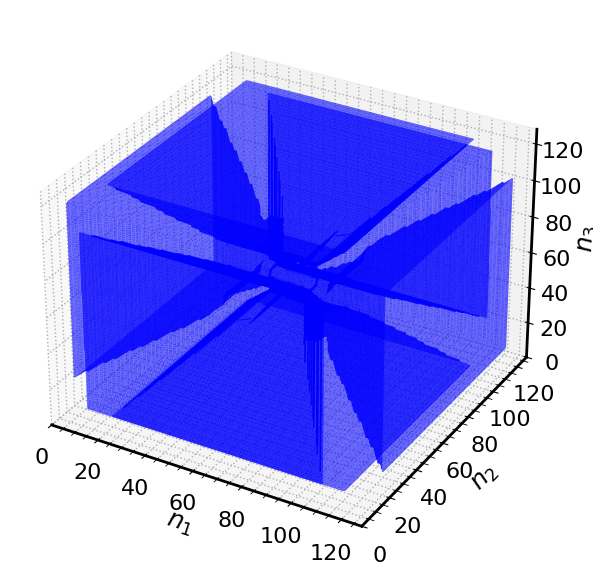

In [5]:
# import matplotlib.pyplot as plt
import numpy as np
from skimage import measure
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
# Set rcParams for customizations
plt.rcParams['figure.figsize'] = (10, 9)  # Default figure size
plt.rcParams['figure.dpi'] = 100         # Adjust figure DPI for better resolution
plt.rcParams['figure.autolayout'] = True # Automatically adjust subplot parameters to fit the figure
plt.rcParams['figure.titlesize'] = 16     # Figure title font size
plt.rcParams['font.size'] = 16
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['xtick.minor.visible'] = True  # Show minor ticks on x-axis
plt.rcParams['ytick.minor.visible'] = True  # Show minor ticks on y-axis
plt.rcParams['axes.grid'] = False
plt.rcParams['axes.grid.which'] = 'both' # Show both major and minor grids
plt.rcParams['axes.linewidth'] = 2.0  
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['grid.linestyle'] = ':'     # Set grid line style to dotted
plt.rcParams['grid.linewidth'] = 1     # Set grid line width
plt.rcParams['legend.fontsize'] = 16      # Legend font size


def viz(volume, level=None):
    L = volume.shape[1]

    # Compute a level within the range of the volume data
    min_val = np.min(volume)
    max_val = np.max(volume)
    if level==None:
        level = (min_val + max_val) * 0.5  # Midpoint level
    # level = np.mean()

    # Debug print to confirm the range
    print(f"Volume range: {min_val:.3f} to {max_val:.3f} — using level={level:.3f}")

    # Extract mesh with marching cubes
    verts, faces, _, _ = measure.marching_cubes(volume, level=level)

    # Plot
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    mesh = Poly3DCollection(verts[faces], alpha=0.7)
    mesh.set_facecolor('b')
    ax.add_collection3d(mesh)

    ax.set_xlim(0, L)
    ax.set_ylim(0, L)
    ax.set_zlim(0, L)
    ax.set_xlabel('$n_1$')
    ax.set_ylabel('$n_2$')
    ax.set_zlabel('$n_3$')

    plt.tight_layout()

## Filterbank
FB = tf.concat([
            sys3d[0],
            sys3d[1],
            tf.transpose(sys3d[1], perm=[0, 2, 3, 1]),
            tf.transpose(sys3d[1], perm=[0, 3, 1, 2]),
            sys3d[2],
            tf.transpose(sys3d[2], perm=[0, 2, 3, 1]),
            tf.transpose(sys3d[2], perm=[0, 3, 1, 2]),
            sys3d[3]
        ], axis=0)
FB.shape
viz(tf.signal.ifftshift(tf.argmax(FB, axis=0)).numpy())

Volume range: 0.000 to 62.000 — using level=31.000


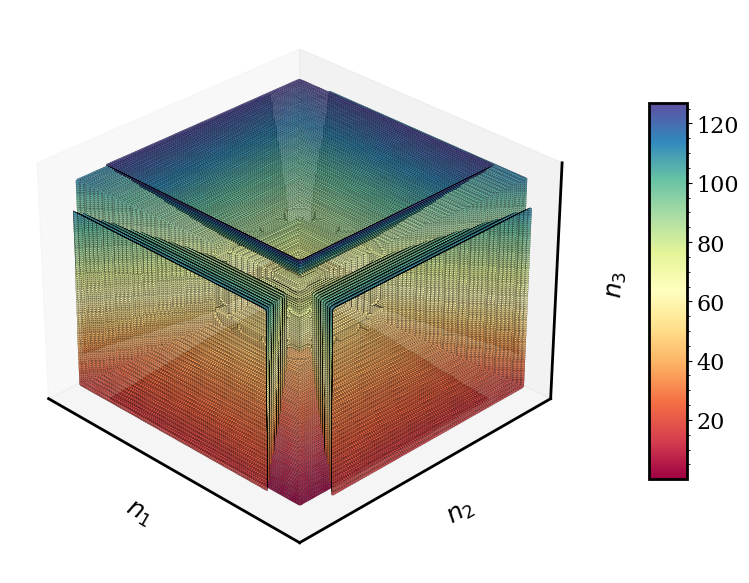

In [40]:
import numpy as np
from skimage import measure
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from matplotlib import cm

# Set rcParams for publication-quality plots
plt.rcParams['figure.figsize'] = (10, 9)
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.autolayout'] = True
plt.rcParams['figure.titlesize'] = 16
plt.rcParams['font.size'] = 16
plt.rcParams['font.family'] = 'serif'
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['ytick.minor.visible'] = True
plt.rcParams['axes.grid'] = False
plt.rcParams['axes.grid.which'] = 'both'
plt.rcParams['axes.linewidth'] = 2.0  
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['grid.linestyle'] = ':'
plt.rcParams['grid.linewidth'] = 1
plt.rcParams['legend.fontsize'] = 16

def viz(volume, level=None, elev=30, azim=135, colormap=cm.Spectral):
    L = volume.shape[1]
    min_val = np.min(volume)
    max_val = np.max(volume)
    if level is None:
        level = (min_val + max_val) * 0.5

    print(f"Volume range: {min_val:.3f} to {max_val:.3f} — using level={level:.3f}")

    # Extract mesh with marching cubes
    verts, faces, _, _ = measure.marching_cubes(volume, level=level)
    face_colors = verts[faces][:, :, 2].mean(axis=1)
    norm = (face_colors - face_colors.min()) / (np.ptp(face_colors) + 1e-8)

    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111, projection='3d')
    mesh = Poly3DCollection(verts[faces], facecolors=colormap(norm), edgecolor='k', linewidths=0.1, alpha=1.0)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, L)
    ax.set_ylim(0, L)
    ax.set_zlim(0, L)
    ax.set_xlabel('$n_1$')
    ax.set_ylabel('$n_2$')
    ax.set_zlabel('$n_3$')

    ax.view_init(elev=elev, azim=azim)
    ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
    ax.grid(False)
    plt.tight_layout()

    # Optional: add colorbar
    mappable = cm.ScalarMappable(cmap=colormap)
    mappable.set_array(face_colors)
    plt.colorbar(mappable, ax=ax, shrink=0.5, aspect=10, pad=0.1)

    # plt.show()


## Filterbank
FB = tf.concat([
            sys3d[0],
            sys3d[1],
            tf.transpose(sys3d[1], perm=[0, 2, 3, 1]),
            tf.transpose(sys3d[1], perm=[0, 3, 1, 2]),
            sys3d[2],
            tf.transpose(sys3d[2], perm=[0, 2, 3, 1]),
            tf.transpose(sys3d[2], perm=[0, 3, 1, 2]),
            sys3d[3]
        ], axis=0)
FB.shape
viz(tf.signal.ifftshift(tf.argmax(FB, axis=0)).numpy())

In [15]:
FB[1:31,...].shape

TensorShape([30, 128, 128, 128])

Volume range: 0.000 to 29.000 — using level=14.500


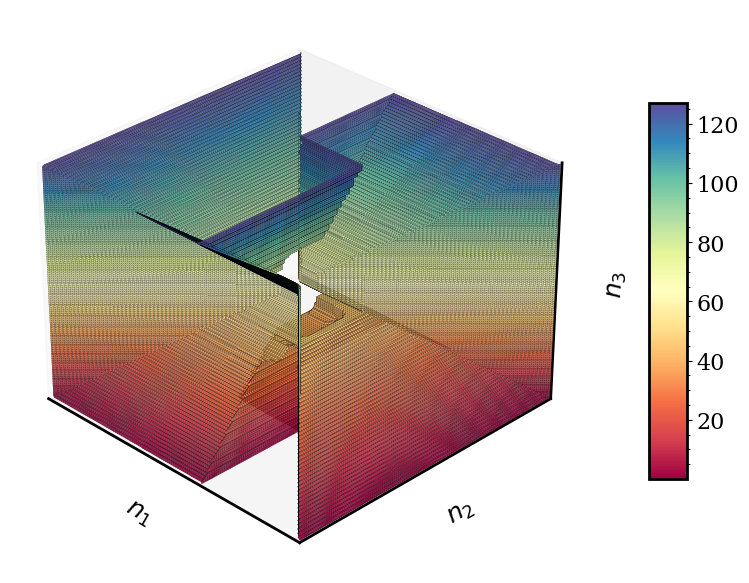

In [41]:
viz(tf.signal.ifftshift(tf.argmax(FB[1:31,...], axis=0)).numpy())

Volume range: 0.000 to 23.000 — using level=11.500


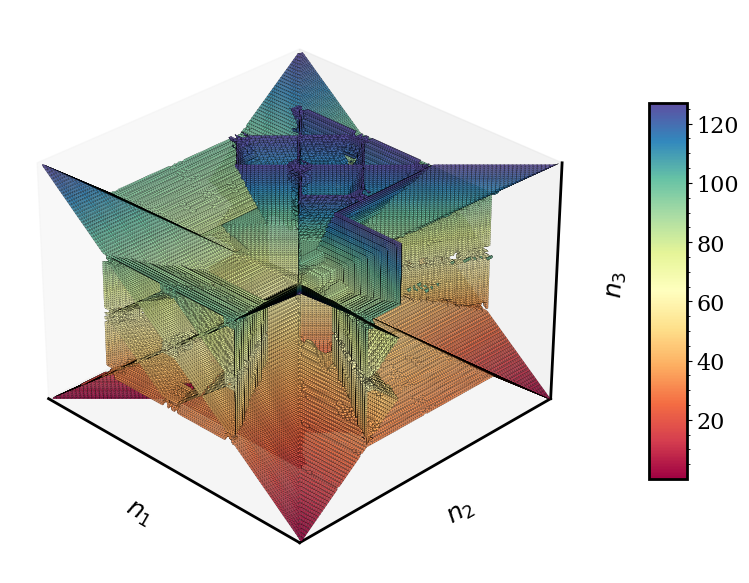

In [42]:
viz(tf.signal.ifftshift(tf.argmax(FB[31:55,...], axis=0)).numpy())

        view LPF and HPF sets

Volume range: 0.000 to 1.000 — using level=0.500
Volume range: 0.000 to 9.000 — using level=4.500
Volume range: 0.000 to 7.000 — using level=3.500
Volume range: 0.000 to 7.000 — using level=3.500


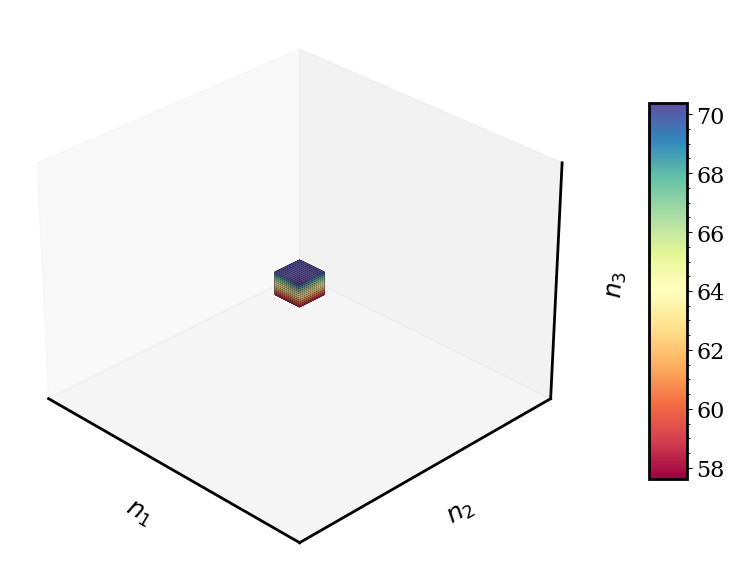

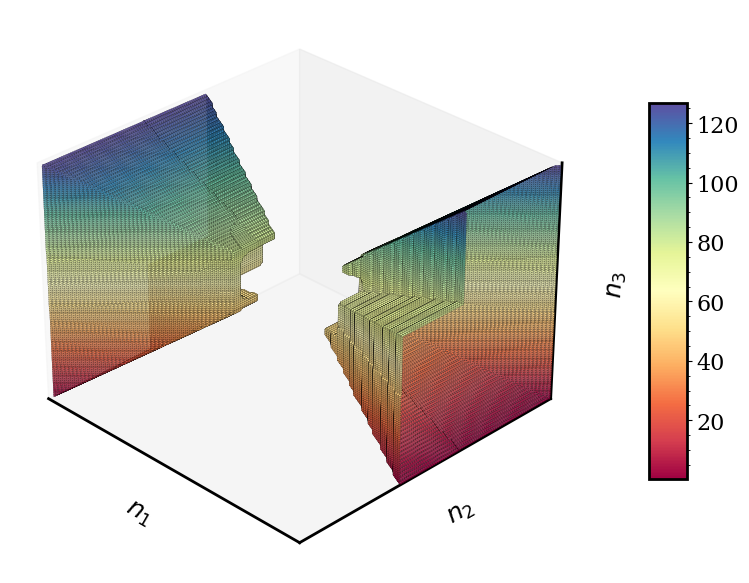

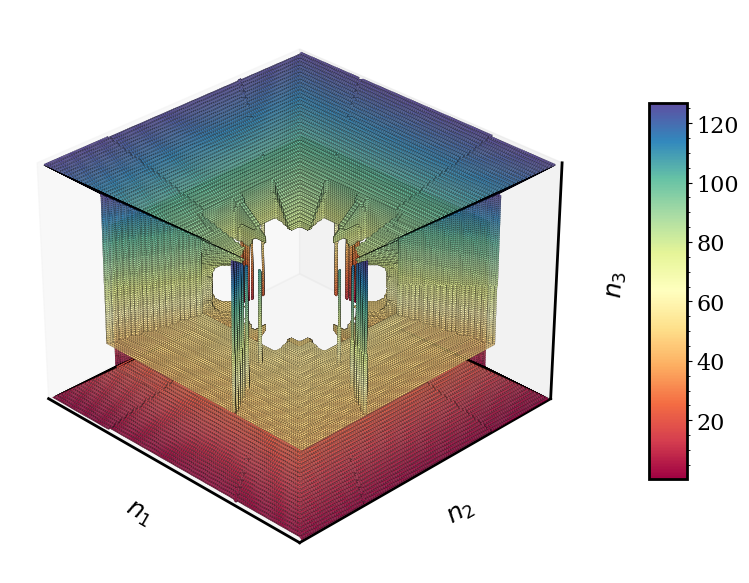

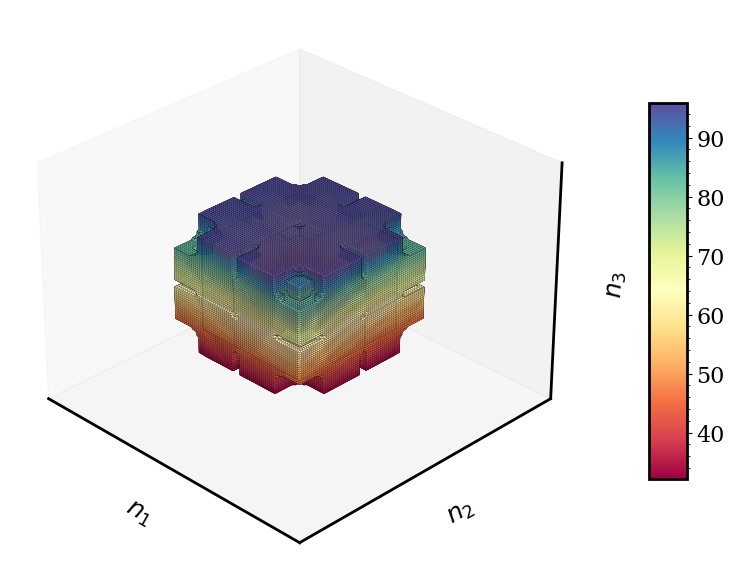

In [43]:
viz(tf.signal.ifftshift(tf.squeeze(sys3d[0])).numpy())
viz(tf.signal.ifftshift(tf.argmax(sys3d[1], axis=0)).numpy())
viz(tf.signal.ifftshift(tf.argmax(sys3d[2], axis=0)).numpy())
viz(tf.signal.ifftshift(tf.argmax(sys3d[3], axis=0)).numpy())

        view individual filters

Volume range: 0.000 to 1.000 — using level=0.500
filtersystem 1 and filter #0


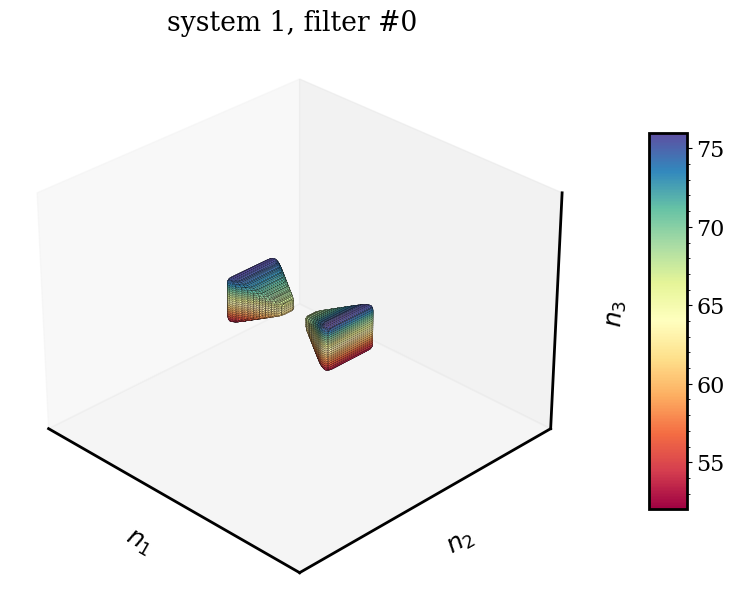

In [44]:
sys = 1
s = np.random.randint(sys3d[sys].shape[0])
viz(np.squeeze(tf.signal.fftshift(sys3d[sys][s,...]))), plt.title(f'system {sys}, filter #{s}')
# s=0 #override!!
print(f"filtersystem {sys} and filter #{s}")

Volume range: 0.000 to 1.000 — using level=0.500
filtersystem 2 and filter #7


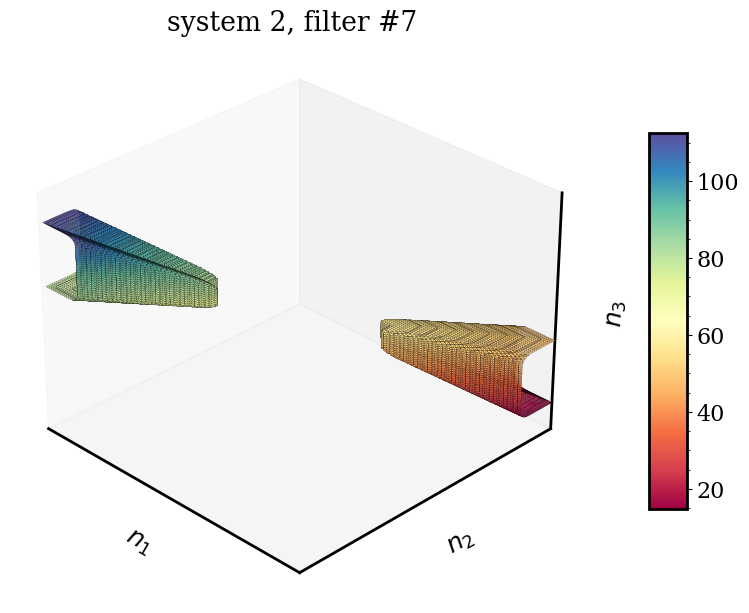

In [45]:
sys = 2
s = np.random.randint(sys3d[sys].shape[0])
viz(np.squeeze(tf.signal.fftshift(sys3d[sys][s,...]))), plt.title(f'system {sys}, filter #{s}')
# s=0 #override!!
print(f"filtersystem {sys} and filter #{s}")

Volume range: 0.000 to 1.000 — using level=0.500
filtersystem 3 and filter #5


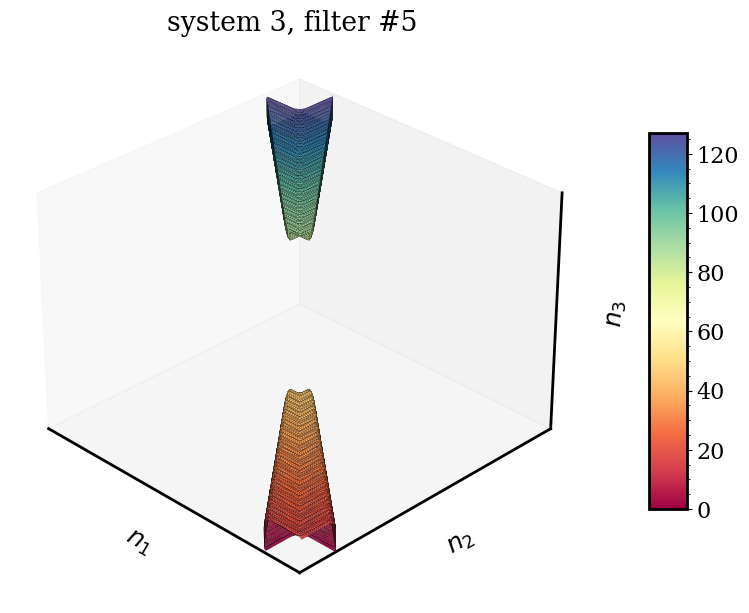

In [46]:
sys = 3
s = np.random.randint(sys3d[sys].shape[0])
viz(np.squeeze(tf.signal.fftshift(sys3d[sys][s,...]))), plt.title(f'system {sys}, filter #{s}')
# s=0 #override!!
print(f"filtersystem {sys} and filter #{s}")


---

<br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>


        tf version of Vineet's code 
        added support for biorthogonal wavelets
        exported to py file ShearletTransform3Dv001.py
        exported to py file ShearletTransform3Dv1.py

In [8]:
# import numpy as np
# from scipy.signal import freqz
# import matplotlib.pyplot as plt
# import math

import tensorflow as tf
import numpy as np # for π
import pywt
import time

class ShearletTransform3D(tf.keras.layers.Layer):
    def __init__(
        self, N, 
        J, 
        L=None,  ## array of +ve integers of length J 
        B=None, 
        a=None, 
        norm=False, 
        wave='db3', 
        transform=None, ## inverse
        **kwargs):#, l1=0.0, l2=0.0):
        super(ShearletTransform3D, self).__init__(**kwargs)
        """params"""
        self.transform = transform
        self.π = tf.constant(np.pi, dtype=tf.float64)
        if a is not None:
            L = [int(tf.math.round(a**(2/3*j))) for j in range(J)]
            B = [a**(j+1)/L[j] for j in range(J)]
        self.N = N
        self.J = J
        self.L = L
        self.B = B
        self.wave = wave
        self.norm = norm
        self.shearlet_system = self.get_shearlet_system('wavedec')
        if 'bio' in self.wave:
            self.shearlet_system_rec = self.get_shearlet_system('waverec')
        else: self.shearlet_system_rec = None
        if self.norm:
            self.norm_factors = self.get_norm_factors()
            
    @tf.function
    def get_norm_factors(self):
        """ Normalizing with thre reconstruction Filterbank!!! recheck here!!!"""       
        FBdec, _ = self.getFB()
        # Compute the squared L2 norm over the spatial dimensions
        norm_factors = tf.reduce_sum(tf.math.square(tf.math.abs(FBdec)), axis=(-3, -2, -1), keepdims=True)  # shape: [F, 1, 1, 1]
        norm_factors = tf.math.sqrt(self.N**3/norm_factors)
        return tf.cast(norm_factors, tf.complex128)
      
    @tf.function
    def v(self, x):
        x = tf.cast(x, tf.float64)  # Ensure consistent dtype if needed
        # Constants casted to match x's dtype
        ten = tf.constant(10.0, dtype=x.dtype)
        fifteen = tf.constant(15.0, dtype=x.dtype)
        six = tf.constant(6.0, dtype=x.dtype)
        one = tf.constant(1.0, dtype=x.dtype)
        zero = tf.constant(0.0, dtype=x.dtype)
        # Conditions
        cond0 = x <= zero
        cond1 = x >= one
        # Polynomial part for 0 < x < 1
        x_poly = x**3 * (ten - fifteen * x + six * x**2)
        return tf.where(cond0, zero, tf.where(cond1, one, x_poly))

    @tf.function
    def phi(self, x):
        x = tf.convert_to_tensor(x, dtype=tf.float64)
        x = tf.abs(x) / self.π#tf.constant(np.pi, dtype=tf.float64)
        # Conditions
        cond1 = x <= 1
        cond2 = tf.logical_and(x > 1, x < 2)
        # phi parts
        part1 = tf.ones_like(x)
        part2 = tf.cos(0.5 * self.π * self.v(x - 1))
        part3 = tf.zeros_like(x)

        return tf.where(cond1, part1, tf.where(cond2, part2, part3))
    
    @tf.function
    def W(self, x, ljbj, ljbj_1):
        return tf.math.sqrt(tf.math.square(self.phi(x/ljbj))-tf.math.square(self.phi(x/ljbj_1))) 

    @tf.function
    def _V_piecewise_fn(self, x):
        # x = tf.convert_to_tensor(x, dtype=tf.float32)
        cond = tf.logical_and(x > -1, x < 1)
        val = tf.sqrt(self.v(1.0 - tf.abs(x)))
        return tf.where(cond, val, tf.zeros_like(x))
    @tf.function
    def _V_wavedec(self, x):
        wavelet = pywt.Wavelet(self.wave)
        h0 = wavelet.dec_lo
        return self.freqz_abs(x, h0)
    @tf.function
    def _V_waverec(self, x):
        wavelet = pywt.Wavelet(self.wave)
        g0 = wavelet.rec_lo
        return self.freqz_abs(x, g0)
    @tf.function
    def freqz_abs(self, x1, h0):
        # Ensure high precision: float64 and complex128
        # h0 = tf.convert_to_tensor(h0, dtype=tf.complex128)
        x1 = self.π*x1
        
        h0 = h0 / tf.sqrt(tf.constant(2.0, dtype=tf.float64))
        h0 = tf.cast(h0, tf.complex128)

        x1 = tf.cast(x1, tf.float64)
        # π = tf.constant(np.pi, dtype=tf.float64)
        x1_clipped = tf.clip_by_value(x1, -self.π, self.π)
        # x1_clipped = tf.clip_by_value(x1, -tf.constant(tf.constant(np.pi, dtype=tf.float64)), tf.constant(np.pi, dtype=tf.float64))
        freqs = tf.reshape(x1_clipped, [-1])  # [M]

        n = tf.range(tf.shape(h0)[0], dtype=tf.float64)  # [L]
        n = tf.reshape(n, [1, -1])                      # [1, L]
        freqs = tf.reshape(freqs, [-1, 1])              # [M, 1]

        exponent = tf.exp(-1j * tf.cast(freqs * n, tf.complex128))  # [M, L]
        response = tf.matmul(exponent, tf.reshape(h0, [-1, 1]))     # [M, 1]
        response_abs = tf.abs(response)                             # [M, 1]

        return tf.cast(tf.reshape(response_abs, tf.shape(x1)), dtype=tf.float64)
        
    @tf.function
    def centered_wrap(self, x, half_modulo=np.pi):
        return (x+half_modulo)%(2*half_modulo)-half_modulo
    
    ## How to use this??
    @tf.function
    def downsample(self, x, fac=2):
        return tf.add_n(
            tf.split(
                tf.add_n(
                    tf.split(
                        tf.add_n(
                            tf.split(x, fac, axis=-1)
                        ), fac, axis=-2
                    )
                ), fac, axis=-3
            )
        )#.numpy()

    @tf.function
    def get_shearlet_system(self, filtertype='wavedec'):
        N = self.N
        L = self.L
        J = self.J
        B = self.B
        
        def V(x):
            if filtertype == "piecewise":
                return self._V_piecewise_fn(x)
            elif filtertype == "wavedec":
                return self._V_wavedec(x)
            elif filtertype == "waverec":
                return self._V_waverec(x)
            else:
                raise ValueError(f"Unknown mode: {filtertype}")

        shearlet_system = [[], [], [], []]
        temp = self.centered_wrap((tf.range(N, dtype=tf.float64) * (2.0 * self.π / N)), self.π)
        w = tf.stack(tf.meshgrid(temp, temp, temp, indexing='ij'), axis=0)
        
        temp = tf.math.abs(w)
        # print(f"{np.logical_and(temp[1]<=temp[0], temp[2]<=temp[0]).dtype} \n{np.logical_and(temp[1]<=temp[0], temp[2]<=temp[0]).dtype}")
        XP0 = tf.logical_and(temp[1]<=temp[0], temp[2]<=temp[0])#.numpy()
        XP1 = tf.logical_and(temp[0]<temp[1], temp[2]<=temp[1])#.numpy()
        XP2 = tf.logical_and(temp[0]<temp[2], temp[1]<temp[2])#.numpy()
        XP0 = tf.cast(XP0, dtype=tf.float64)
        XP1 = tf.cast(XP1, dtype=tf.float64)
        XP2 = tf.cast(XP2, dtype=tf.float64)

        w0 = w[0, :, :1, :1]
        shearlet = self.phi((L[J-1]*B[J-1])*w0)
        shearlet = shearlet*XP0 + tf.transpose(shearlet, perm=[1, 0, 2])*XP1 + tf.transpose(shearlet, perm=[1, 2, 0])*XP2
        shearlet_system[0].append(shearlet)
        
        temp = w[0, :, :, :1]
        # ratio = np.divide(w[1, :, :, :1], temp, out=np.full_like(temp, np.inf), where=temp!=0) ## -----totf
        safe_temp = tf.where(temp != 0, temp, tf.constant(np.inf, dtype=temp.dtype))
        ratio = w[1, :, :, :1] / safe_temp

        for j in range(J):
            W0 = self.W(w0, (L[j]*B[j])/(L[J-1]*B[J-1]), (1 if j==0 else L[j-1]*B[j-1])/(L[J-1]*B[J-1]))
            W1 = tf.transpose(W0, perm=[1, 0, 2])*XP1
            W2 = tf.transpose(W0, perm=[1, 2, 0])*XP2
            W0 = W0*XP0
            temp = L[j]*ratio

            for l1 in range(-L[j], L[j]+1):
                shear1 = V(temp-l1)
                for l2 in range(-L[j], L[j]+1):
                    shearlet = shear1*tf.transpose(V(temp-l2), perm=[0, 2, 1])
                    if abs(l1)==L[j]:
                        shearlet_ = shear1*tf.transpose(V(temp+l2), perm=[0, 2, 1]) if l1<0 else shearlet
                        if abs(l2)==L[j]:
                            shearlet__ = V(temp+l1)*tf.transpose(V(temp-l2),perm=[0, 2, 1]) if l2<0 else shearlet
                            shearlet = shearlet*W0 + tf.transpose(shearlet_, perm=[1, 0, 2])*W1 + tf.transpose(shearlet__,perm=[2, 1, 0])*W2
                            shearlet_system[3].append(shearlet)
                        else:
                            shearlet = shearlet*W0 + tf.transpose(shearlet_, perm=[1, 0, 2])*W1
                            shearlet_system[2].append(shearlet)
                    elif abs(l2)!=L[j]:
                        shearlet = shearlet*W0
                        shearlet_system[1].append(shearlet)
        for i in range(4):
            shearlet_system[i] = tf.stack(shearlet_system[i], axis=0)
        print([shearlets.dtype for shearlets in shearlet_system])
        return shearlet_system

    def getFB(self):
        if 'bio' in self.wave:
            return self._analysis_bank_tensor(), self._synthesis_bank_tensor_biortho()
        else:
            return self._analysis_bank_tensor(), None
    def _analysis_bank_tensor(self):
        FB = [
            self.shearlet_system[0],
            self.shearlet_system[1],
            tf.transpose(self.shearlet_system[1], perm=[0, 2, 3, 1]),
            tf.transpose(self.shearlet_system[1], perm=[0, 3, 1, 2]),
            self.shearlet_system[2],
            tf.transpose(self.shearlet_system[2], perm=[0, 2, 3, 1]),
            tf.transpose(self.shearlet_system[2], perm=[0, 3, 1, 2]),
            self.shearlet_system[3]
        ]
        return tf.cast(tf.concat(FB, axis=0), tf.complex128)
    def _synthesis_bank_tensor_biortho(self):
        FB = [
            self.shearlet_system_rec[0],
            self.shearlet_system_rec[1],
            tf.transpose(self.shearlet_system_rec[1], perm=[0, 2, 3, 1]),
            tf.transpose(self.shearlet_system_rec[1], perm=[0, 3, 1, 2]),
            self.shearlet_system_rec[2],
            tf.transpose(self.shearlet_system_rec[2], perm=[0, 2, 3, 1]),
            tf.transpose(self.shearlet_system_rec[2], perm=[0, 3, 1, 2]),
            self.shearlet_system_rec[3]
        ]
        return tf.cast(tf.concat(FB, axis=0), tf.complex128)

    def forward(self, x):
        x = tf.cast(x, dtype=tf.complex128)
        xfft = tf.signal.fft3d(x)
        # FB = self._analysis_bank_tensor()
        FB, _ = self.getFB()
        filtered = tf.einsum('ijk,fijk->fijk', xfft, FB)        
        filtered = tf.signal.ifft3d(filtered)
        # filtered = filtered[..., :x.shape[-3], :x.shape[-2], :x.shape[-1]]
        if self.norm:
            filtered *= self.norm_factors
        return filtered

    def call(self, x):
        if self.transform==None:
            return self.forward(x)
        elif self.transform=='inverse':
            return self.inverse(x)
        else:
            raise ValueError(f"Unknown key {transform}!! keys 'DST' or 'IDST' only allowed")

    def inverse(self, y):
        y = tf.cast(y, tf.complex128)
        if self.norm:
            y = y/self.norm_factors
        yfft = tf.signal.fft3d(y)             
        if 'bio' in self.wave:
            _, FB = self.getFB()
        else:
            FB, _ = self.getFB()        
        synthesized = tf.einsum('fijk,fijk->ijk', yfft, FB)
        synthesized = tf.signal.ifft3d(synthesized)#, axes=(-3, -2, -1))
        return tf.math.real(synthesized)
        # return synthesized

if __name__=='__main__':
    start_time = time.time()
    # ST3D = ShearletTransform3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True)
    # ST3D = ShearletTransform3D(N=32, J=2, L=[1, 2], B=[4, 8], norm=True, wave='db15')
    # ST3D = ShearletTransform3D(N=32, J=2, L=[1, 2], B=[4, 8], norm=True, wave='bior1.5')
    ST3D = ShearletTransform3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True, wave='db15')

    # ST3D = ShearletTransform3D(N=32, J=3, L=[1, 4, 8], B=[6, 8, 10], norm=True, wave='db20')
    print(time.time()-start_time)

    ## Example: shearlet filters
    ## view filters
    print(ST3D)
    ## get the shearlet system
    sys3d = ST3D.shearlet_system
    len(sys3d), type(sys3d)
    np.squeeze(sys3d[0]).shape
    # print filter shapes
    print('\nFilter shapes: ',[_.shape for _ in sys3d])
    print('Filter dtypes: ',[_.dtype for _ in sys3d])


    ## Example: perfect reconstruction 
    ## check perfect reconstruction
    n = 128
    axis1 = np.arange(0,n)
    x = np.einsum('i,j->ij', axis1, axis1)
    x = np.einsum('i,j,k->ijk', axis1, axis1, axis1)
    # viz(x)
    ST3D = ShearletTransform3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='rbio1.5')
    print(f"\nReconstruction error: {tf.reduce_sum(tf.abs(ST3D.inverse(ST3D.forward(x)) - x))}\n")
    # viz(ST3D.inverse(ST3D(x)))

    # s = np.random.randint(_[1].shape[0])
    # s=0 #override!!
    # print(s)
    # _ = _[1][2,...]
    # viz(np.squeeze()), plt.title(s)`

[tf.float64, tf.float64, tf.float64, tf.float64]
2.01658296585083
<ShearletTransform3D name=shearlet_transform3d_2, built=False>

Filter shapes:  [TensorShape([1, 128, 128, 128]), TensorShape([10, 128, 128, 128]), TensorShape([8, 128, 128, 128]), TensorShape([8, 128, 128, 128])]
Filter dtypes:  [tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]

Reconstruction error: 0.00014625910852481894



In [11]:
c = 2
input_shape = (n,n,n)
inputs = tf.keras.Input(input_shape)

H  = ShearletTransform3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='bior1.5')
Hr = ShearletTransform3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='bior1.5', transform='inverse')
q = H(inputs)
outputs = Hr(q)
# outputs = q
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.summary()

[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]


ValueError: Exception encountered when calling ShearletTransform3D.call().

[1mCould not automatically infer the output shape / dtype of 'shearlet_transform3d_4' (of type ShearletTransform3D). Either the `ShearletTransform3D.call()` method is incorrect, or you need to implement the `ShearletTransform3D.compute_output_spec() / compute_output_shape()` method. Error encountered:

Shape must be rank 3 but is rank 4
	 for 0th input and equation: ijk,fijk->fijk for '{{node einsum/Einsum}} = Einsum[N=2, T=DT_COMPLEX128, equation="ijk,fijk->fijk"](FFT3D, Cast_1)' with input shapes: [?,128,128,128], [63,128,128,128].[0m

Arguments received by ShearletTransform3D.call():
  • args=('<KerasTensor shape=(None, 128, 128, 128), dtype=float32, sparse=False, name=keras_tensor_4>',)
  • kwargs=<class 'inspect._empty'>

In [4]:
## view filters
print(ST3D)
## get the shearlet system
sys3d = ST3D.shearlet_system
len(sys3d), type(sys3d)
np.squeeze(sys3d[0]).shape
# print filter shapes
print('\nFilter shapes: ',[_.shape for _ in sys3d])
print('Filter dtypes: ',[_.dtype for _ in sys3d])

<ShearletTransform3D name=shearlet_transform3d_1, built=False>

Filter shapes:  [TensorShape([1, 128, 128, 128]), TensorShape([10, 128, 128, 128]), TensorShape([8, 128, 128, 128]), TensorShape([8, 128, 128, 128])]
Filter dtypes:  [tf.float64, tf.float64, tf.float64, tf.float64]


        check perfect reconstruction

In [4]:
n = 128
axis1 = np.arange(0,n)
x = np.einsum('i,j->ij', axis1, axis1)
x = np.einsum('i,j,k->ijk', axis1, axis1, axis1)
# viz(x)
ST3D = ShearletTransform3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='rbio1.5')
print(f"\nReconstruction error: {tf.reduce_sum(tf.abs(ST3D.inverse(ST3D.forward(x)) - x))}\n")
# viz(ST3D.inverse(ST3D(x)))

[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]

Reconstruction error: 0.00014625910852481894



In [7]:
# dst3d = ShearletTransform3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='rbio1.5')
# idst3d = ShearletTransform3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='rbio1.5', transform='idst')
# print(f"\nReconstruction error: {tf.reduce_sum(tf.abs(idst3d(dst3d(x)) - x))}\n")

#        visualize the fitlers

In [7]:

    # plt.show()

# for el in sys3d
[el.shape for el in sys3d]
[el.dtype for el in sys3d]
# viz(np.squeeze(tf.signal.fftshift(sys3d[0])))

[tf.float64, tf.float64, tf.float64, tf.float64]

    view all filters in one combined plot

[TensorShape([1, 128, 128, 128]), TensorShape([1, 128, 128, 128]), TensorShape([1, 128, 128, 128]), TensorShape([1, 128, 128, 128])]
Volume range: 0.000 to 3.000 — using level=1.500


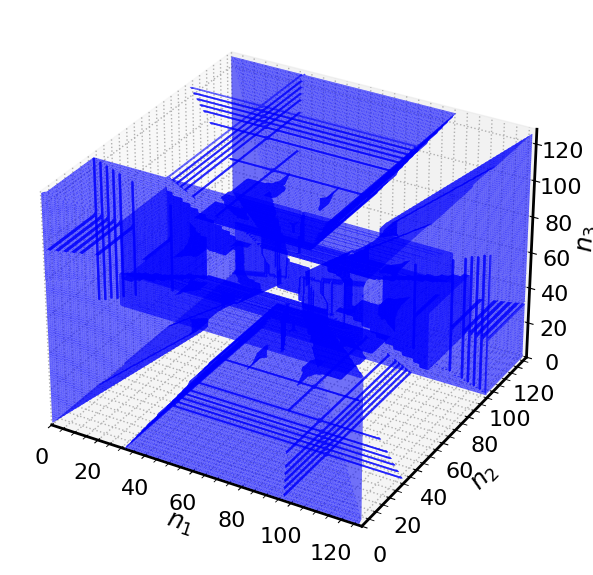

In [36]:
import tensorflow as tf
_ = [tf.expand_dims(tf.argmax(tf.signal.fftshift(el), axis=0), axis=0) for el in sys3d][:]
print([el.shape for el in _])
_ = tf.concat(_, axis=0)
_ = tf.argmax(_, axis=0)
# _.shape
# for i,el in enumerate(sys3d):
tf.signal.fftshift(_)
#   _ = tf.reduce_sum(el, axis=0)
#   # plt.subplot(1, 4, i+1)
#   # print(i,_.shape, _.dtype)
viz(np.squeeze(_))

[TensorShape([1, 128, 128, 128]), TensorShape([1, 128, 128, 128]), TensorShape([1, 128, 128, 128]), TensorShape([1, 128, 128, 128])]
Volume range: 0.000 to 2.186 — using level=1.093


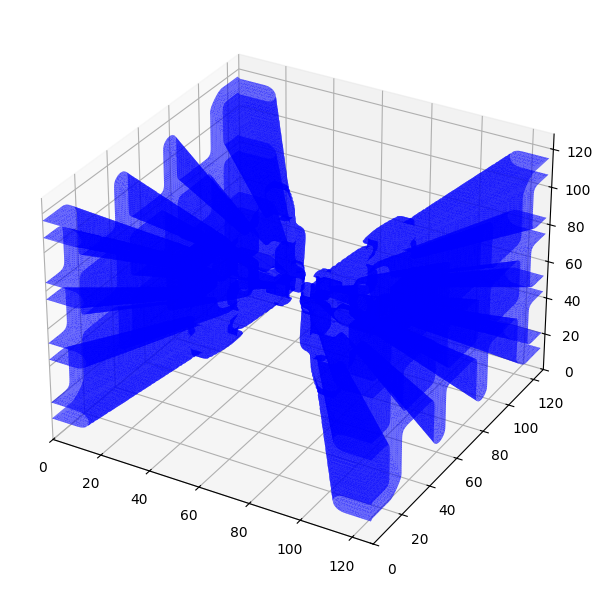

[TensorShape([1, 32, 32, 32]), TensorShape([1, 32, 32, 32]), TensorShape([1, 32, 32, 32]), TensorShape([1, 32, 32, 32])]
Volume range: 0.000 to 2.000 — using level=1.000


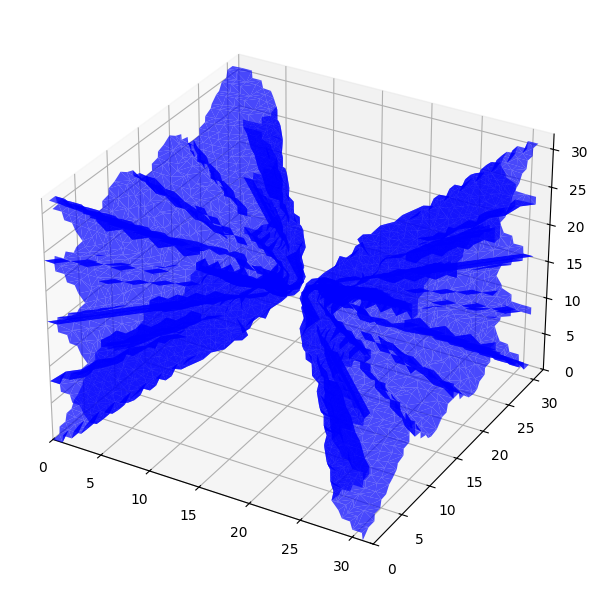

#    View the complete tiling of the 3D space

In [11]:
print('\nFilter shapes: ',[_.shape for _ in sys3d])


Filter shapes:  [TensorShape([1, 128, 128, 128]), TensorShape([10, 128, 128, 128]), TensorShape([8, 128, 128, 128]), TensorShape([8, 128, 128, 128])]


In [560]:
# import tensorflow as tf
# filter_groups = [
#     tf.expand_dims(
#         tf.reduce_sum(
#             tf.signal.fftshift(el), axis=0), axis=0) for el in sys3d]
# # transpose(0, 2, 3, 1)
# #         yield self.shearlet_system[1].transpose(0, 3, 1, 2)
# print('New shapes: ', [el.shape for el in filter_groups])
# # _ = tf.concat(_, axis=0)
# # _ = tf.reduce_sum(_, axis=0)
# # # _.shape
# # # for i,el in enumerate(sys3d):
# # tf.signal.fftshift(_)
# # #   _ = tf.reduce_sum(el, axis=0)
# # #   # plt.subplot(1, 4, i+1)
# # #   # print(i,_.shape, _.dtype)
# # viz(np.squeeze(_))

        Low pass filter (Group 0 with only one LPF)

Volume range: 0.000 to 1.000 — using level=0.500


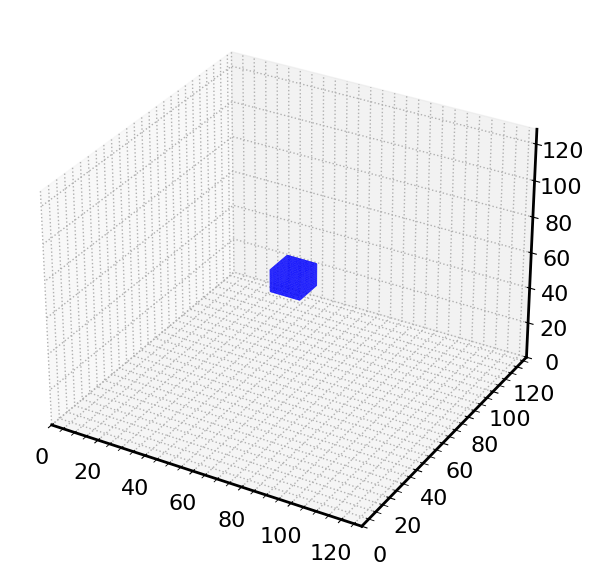

In [12]:
viz(tf.squeeze(tf.signal.ifftshift(sys3d[0])).numpy())

In [18]:
for item in sys3d:
    print(np.min(item), np.max(item), np.mean(item), np.var(item))

0.0 1.0 0.0010138110658038436 0.0008473109578876267
0.0 1.0000000000000004 0.021545694762620627 0.017719304374433538
0.0 1.0000000000000004 0.01898282580098604 0.015524155953514996
0.0 1.0000000000000004 0.011047014029306496 0.00893020523333246


        Filter Group 1 (from all three 3d planes)

1
Volume range: 0.000 to 2.000 — using level=1.000


TensorShape([128, 128, 128])

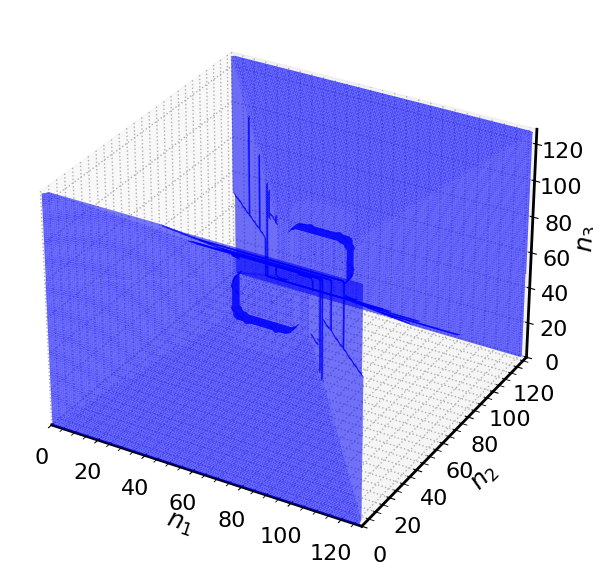

In [6]:
def get_all_3d_planes(item):
    el1 = tf.argmax(sys3d[item], axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    el2 = tf.argmax(tf.transpose(sys3d[item], perm=[0,2,3,1]), axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    el3 = tf.argmax(tf.transpose(sys3d[item], perm=[0,3,1,2]), axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    _ =[tf.expand_dims(__, axis=0) for __ in [el1,el2,el3]]
    _ = tf.concat(_, axis=0)
    return tf.argmax(_, axis=0)

item = 1
print(item)
group1 = get_all_3d_planes(item)
viz(tf.signal.ifftshift(group1).numpy())
group1.shape     


        Filter Group 2 (from all three 3d planes)

2
Volume range: 0.000 to 2.000 — using level=1.000


TensorShape([128, 128, 128])

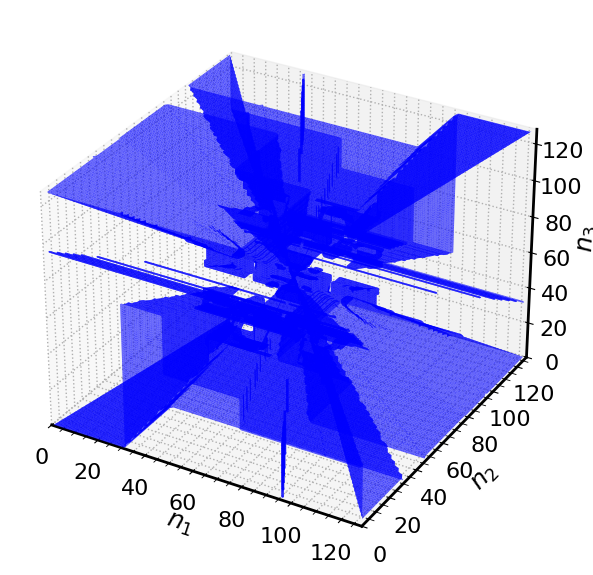

In [7]:
item = 2
print(item)
group1 = get_all_3d_planes(item)
viz(tf.signal.ifftshift(group1).numpy())
group1.shape     


        Filter Group 3


In [8]:
tf.signal.ifftshift(sys3d[3]).shape

TensorShape([8, 128, 128, 128])

Volume range: 0.000 to 7.000 — using level=3.500


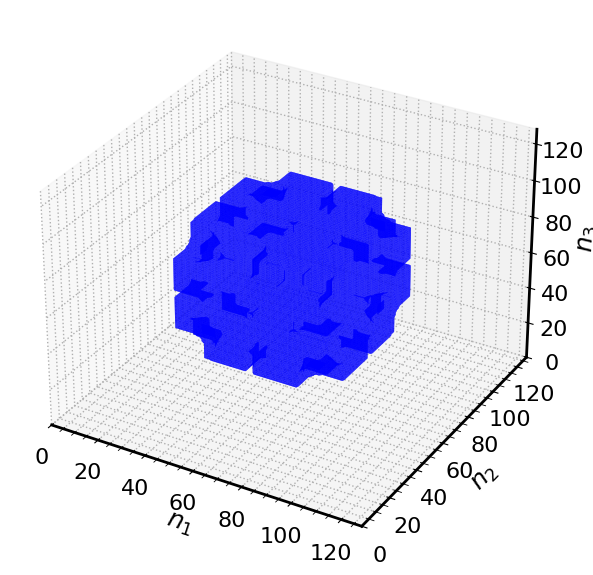

In [10]:
viz(tf.squeeze(tf.signal.ifftshift(tf.argmax(sys3d[3], axis=0))).numpy())

        all in one

In [586]:
sys3d[item].dtype

dtype('float64')

Volume range: 0.500 to 1.000 — using level=0.750


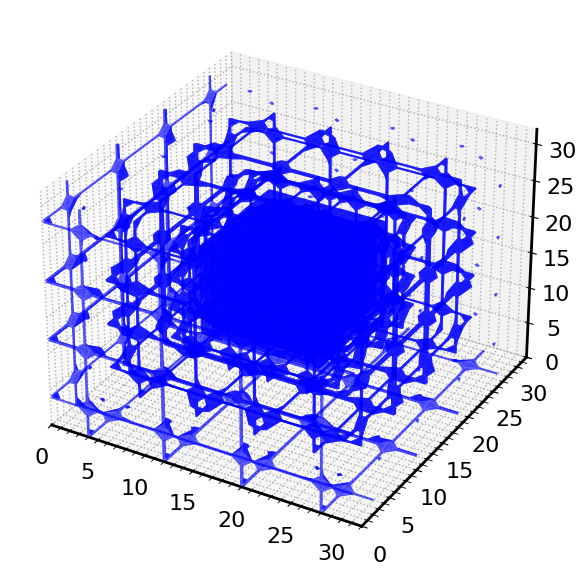

In [ ]:
# volume = tf.signal.ifftshift(
#     tf.maximum(
#         tf.maximum(
#             tf.squeeze(sys3d[0]),
#             tf.reduce_max(tf.stack([
#                 tf.reduce_max(sys3d[1], axis=0),
#                 tf.reduce_max(tf.transpose(sys3d[1], perm=[0,2,3,1]), axis=0),
#                 tf.reduce_max(tf.transpose(sys3d[1], perm=[0,3,1,2]), axis=0),
#                 tf.reduce_max(sys3d[2], axis=0),
#                 tf.reduce_max(tf.transpose(sys3d[2], perm=[0,2,3,1]), axis=0),
#                 tf.reduce_max(tf.transpose(sys3d[2], perm=[0,3,1,2]), axis=0),
#             ], axis=0), axis=0)
#         ),
#         tf.reduce_max(sys3d[3], axis=0)
#     )
# ).numpy()
# viz(volume)

In [37]:
for item in range(1,3):
    print(item)
    # item = 2
    el1 = tf.argmax(sys3d[item], axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    el2 = tf.argmax(tf.transpose(sys3d[item], perm=[0,2,3,1]), axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    el3 = tf.argmax(tf.transpose(sys3d[item], perm=[0,3,1,2]), axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    _ =[tf.expand_dims(__, axis=0) for __ in [el1,el2,el3]]
    _ = tf.concat(_, axis=0)
    _ = tf.argmax(_, axis=0)
b = _
a = tf.squeeze(sys3d[0])
c = tf.squeeze(tf.argmax(sys3d[3], axis=0))
a.shape, b.shape, c.shape
a.dtype, b.dtype, c.dtype
# viz(tf.signal.ifftshift(a + b + c).numpy())#, level=0.99)
# # viz(
# #     tf.signal.ifftshift(
# #        )
# #     ).numpy())
# _12, tf.squeeze(sys3d[0]), 
#         tf.squeeze(tf.argmax(sys3d[3], axis=0)

# viz(
#     tf.signal.ifftshift(
#         tf.squeeze(sys3d[0]) + 
#         _12 +
#         tf.squeeze(tf.reduce_sum(sys3d[3], axis=0))
#         ).numpy())#, level=0.99)
# def threshold_midpoint(x):
#     x = tf.cast(x, tf.float32)
#     min_val = tf.reduce_min(x)
#     max_val = tf.reduce_max(x)
#     midpoint = (min_val + max_val) / 2.0
#     # print(midpoint)
#     return x
# #     # return tf.where(x >= midpoint, 1, 0)
# a = threshold_midpoint(a) 
# b = threshold_midpoint(b)
# c = threshold_midpoint(c)
# _ = np.logical_or(np.logical_or(a, b), c)
# _.shape
# viz()
# viz(tf.signal.ifftshift(a + b + c).numpy())
# # vol = 
# # vol = tf.stack([_0,_12,_3]).numpy()
# # vol.shape
# # _0+_12+_3
# # viz(tf.signal.ifftshift(vol))

# # vol
# # a.shape, b.shape, c.dtype
# # vol = np.logical_or(np.logical_or(a, b), c)
# vol=a+b+c
# vol.shape
# # tf.sig

1
2


(tf.float64, tf.int64, tf.int64)

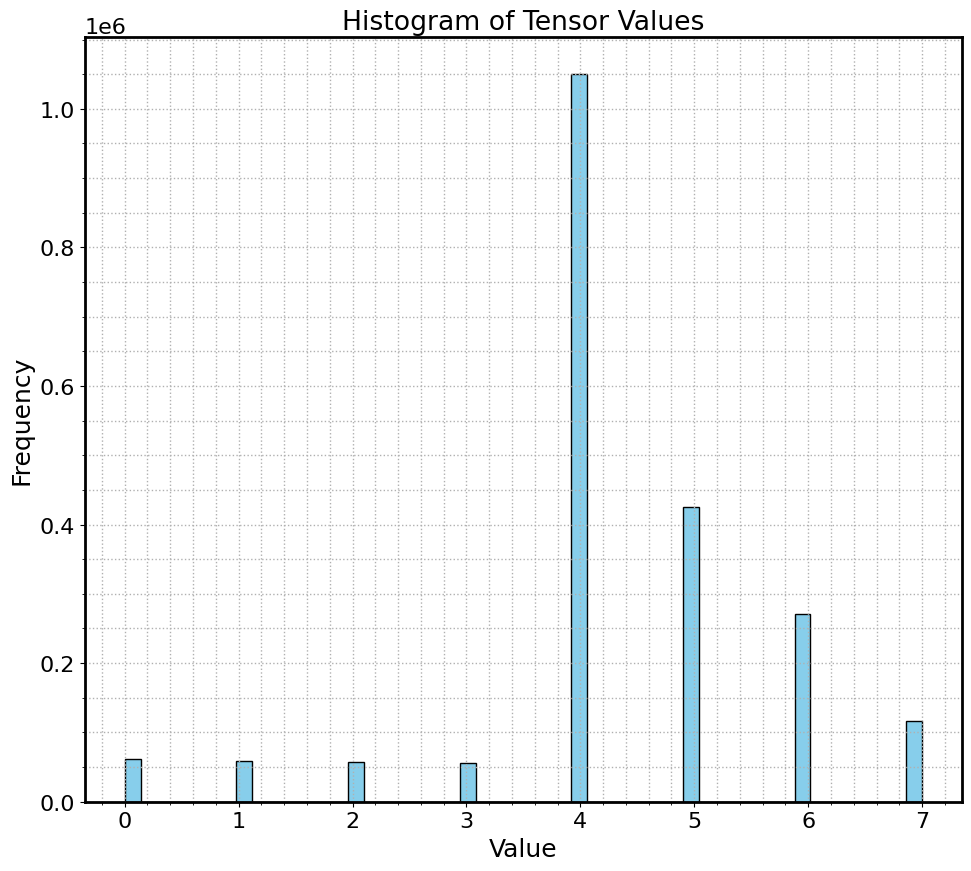

TypeError: Cannot convert 0.6 to EagerTensor of dtype int64

In [38]:
import tensorflow as tf
import matplotlib.pyplot as plt

def hist(x, bins=50, title='Histogram of Tensor Values', color='skyblue'):
    """
    Plot a histogram of a 3D tensor's values with auto x/y limits.

    Args:
        x (tf.Tensor): A 3D tensor (shape [n, n, n]) with numerical values.
        bins (int): Number of histogram bins.
        title (str): Plot title.
        color (str): Bar color.
    """
    # Flatten to 1D
    x_flat = tf.reshape(x, [-1]).numpy()

    # Plot histogram and get bin info
    counts, bin_edges, _ = plt.hist(x_flat, bins=bins, color=color, edgecolor='black')

    # Set axis limits
    # plt.xlim(bin_edges[0], bin_edges[-1])
    # plt.ylim(0, counts.max() * 1.1)

    # Labels and display
    plt.title(title)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

# hist(tf.where(b > 0.4, 0.1, 0.0))
hist(c)
hist(tf.where(c > 0.6, 0.1, 0.0))


In [150]:
np.unique(a)

array([0.        , 0.16188639, 0.16188639, 0.70710678, 0.70710678,
       0.9868094 , 0.9868094 , 1.        ])

Volume range: 0.000 to 2.000 — using level=1.000


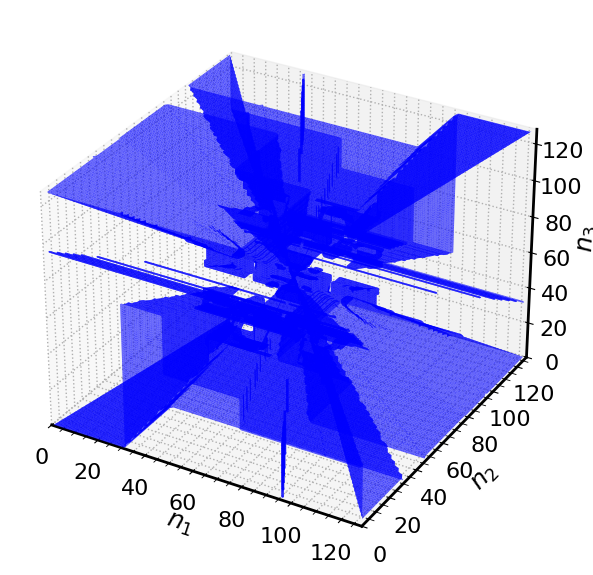

In [39]:
viz(tf.signal.ifftshift(b).numpy())

In [82]:
np.min(_0), np.max(_0), np.min(_12), np.max(_12), np.min(_3), np.max(_3)
np.mean(_0), np.mean(_12), np.mean(_3)

(np.float64(0.0010138110658038436),
 np.float64(0.9864811897277832),
 np.float64(0.08837611223445117))

In [ ]:
tf.squeeze(sys3d[0])

TensorShape([128, 128, 128])

In [ ]:
for item in range(1,3):
    print(item)
    # item = 2
    el1 = tf.argmax(sys3d[item], axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    el2 = tf.argmax(tf.transpose(sys3d[item], perm=[0,2,3,1]), axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    el3 = tf.argmax(tf.transpose(sys3d[item], perm=[0,3,1,2]), axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    _ =[tf.expand_dims(__, axis=0) for __ in [el1,el2,el3]]
    _ = tf.concat(_, axis=0)
    _ = tf.argmax(_, axis=0)
_12 = _
_12.shape

# viz(
#     tf.signal.ifftshift(

#         tf.squeeze(sys3d[0]) + 
#         tf.expand_dims(_12, axis=0) +
#         tf.squeeze(tf.argmax(sys3d[3], axis=0))
#         ).numpy())#, level=0.99)

1
2


TensorShape([128, 128, 128])

Volume range: 0.000 to 2.000 — using level=1.000


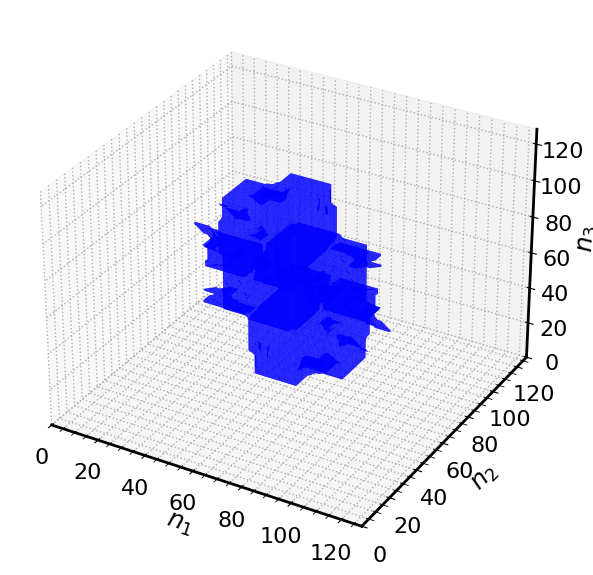

In [54]:
viz(tf.signal.ifftshift(
    tf.argmax(
    tf.concat([
    sys3d[0],
    tf.expand_dims(_12, axis=0),
    tf.expand_dims(tf.argmax(sys3d[3], axis=0), axis=0)
    ], axis=0), axis=0)).numpy())


FIGURE ABOVE SHOWS THE COMPLETE TILING OF THE 3D SPACE

---

Volume range: 0.000 to 1.721 — using level=0.861
Volume range: 0.000 to 1.721 — using level=0.861
Volume range: 0.000 to 1.721 — using level=0.861


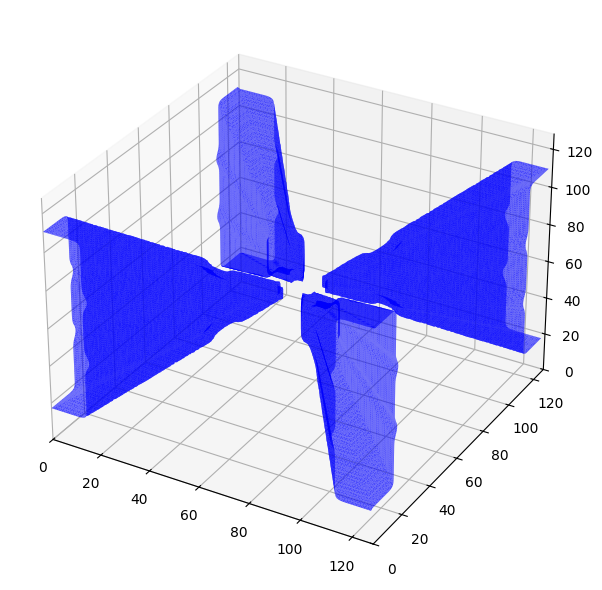

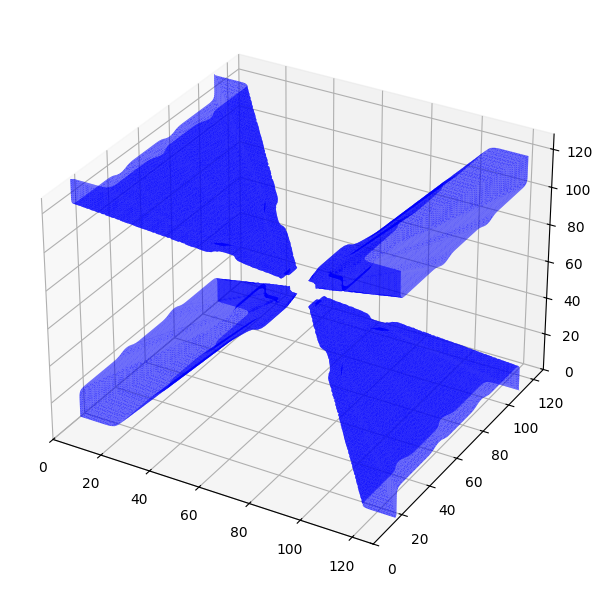

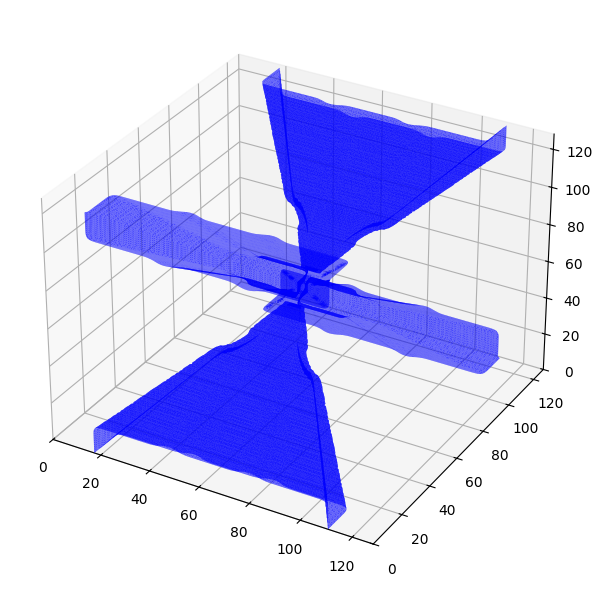

In [416]:
## Filter g
item = 2
el = tf.reduce_sum(sys3d[item], axis=0)
viz(tf.signal.ifftshift(el).numpy())
el = tf.reduce_sum(tf.transpose(sys3d[item], perm=[0,2,3,1]), axis=0)
viz(tf.signal.ifftshift(el).numpy())
el = tf.reduce_sum(tf.transpose(sys3d[item], perm=[0,3,1,2]), axis=0)
viz(tf.signal.ifftshift(el).numpy())


1
2


TensorShape([128, 128, 128])

Volume range: 0.000 to 1.888 — using level=0.944


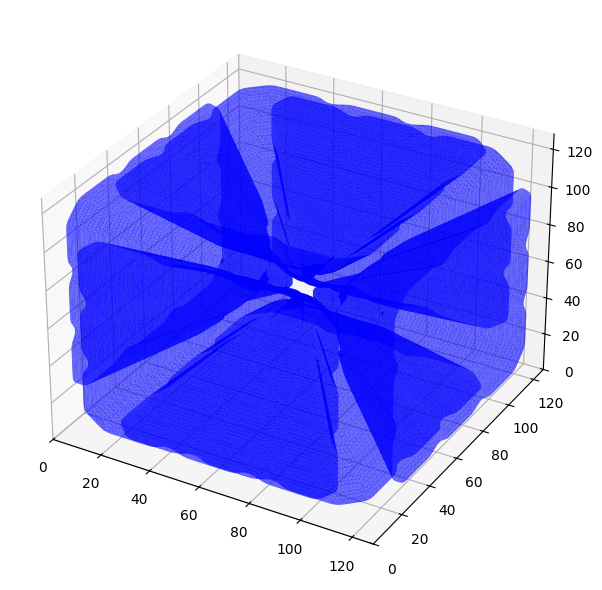

Volume range: 0.000 to 2.184 — using level=1.092


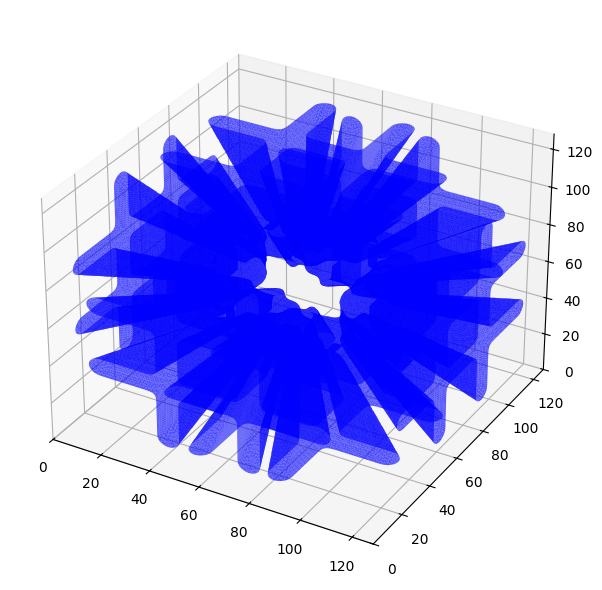

In [424]:
viz(tf.signal.ifftshift(_1).numpy())

In [529]:
for item in range(1,3):
    print(item)
    # item = 2
    el1 = tf.reduce_sum(sys3d[item], axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    el2 = tf.reduce_sum(tf.transpose(sys3d[item], perm=[0,2,3,1]), axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    el3 = tf.reduce_sum(tf.transpose(sys3d[item], perm=[0,3,1,2]), axis=0)
    # viz(tf.signal.ifftshift(el).numpy())
    _ =[tf.expand_dims(__, axis=0) for __ in [el1,el2,el3]]
    _ = tf.concat(_, axis=0)
    _ = tf.reduce_sum(_, axis=0)
_12 = _
_12.shape

1
2


TensorShape([128, 128, 128])

In [525]:
np.unique(sys3d[1])

array([0.00000000e+00, 1.08333559e-34, 3.08148791e-33, ...,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00])

Volume range: 0.000 to 2.916 — using level=1.458


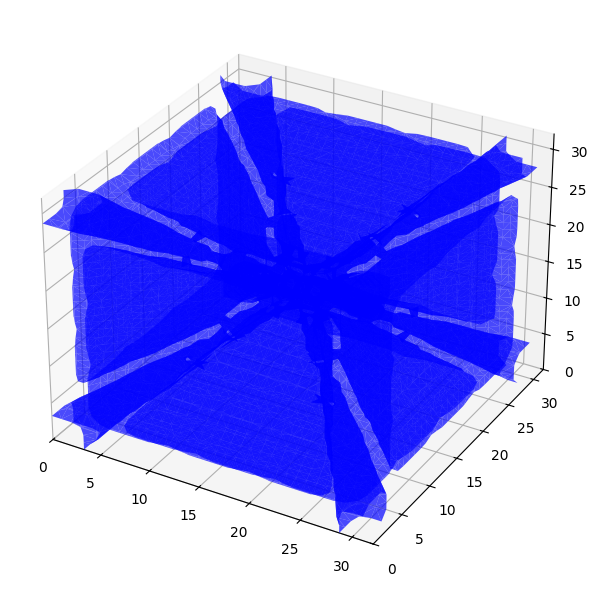

----

#    check perfect reconstruction

In [202]:
pywt.families(short=False)
pywt.wavelist('rbio')

['rbio1.1',
 'rbio1.3',
 'rbio1.5',
 'rbio2.2',
 'rbio2.4',
 'rbio2.6',
 'rbio2.8',
 'rbio3.1',
 'rbio3.3',
 'rbio3.5',
 'rbio3.7',
 'rbio3.9',
 'rbio4.4',
 'rbio5.5',
 'rbio6.8']

Volume range: 0.000 to 250047.000 — using level=125023.500
[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]
1.600050449371338
7114978.854417562 -1218443.9862509936 (63, 64, 64, 64) +
transformed x shape is  (63, 64, 64, 64)
52


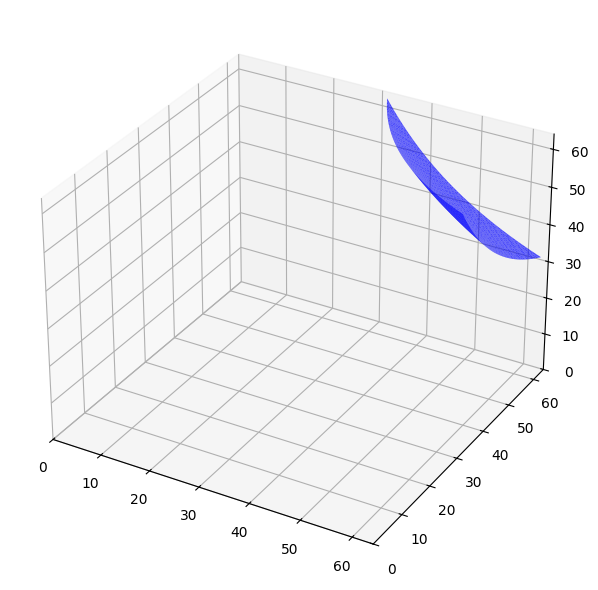

In [203]:
n = 64
axis1 = np.arange(0,n)
# axis1 = np.sin(axis1)
# axis1 = 1-np.exp(axis1)

x = np.einsum('i,j->ij', axis1,axis1)
x = np.einsum('i,j,k->ijk', axis1,axis1,axis1)
viz(x)

# n = 32
wave = 'db15'
wave = 'rbio6.8'
start_time = time.time()
# ST3D = ShearletTransform3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True)
ST3D = ShearletTransform3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave=wave)
# ST3D = ShearletTransform3D(N=64, J=2, L=[1, 2], B=[4, 8], norm=True, wave='db15')
print(time.time()-start_time)

# n=32
# x = np.random.rand(n,n,n)
# x = coords.astype(np.float32)
_ = ST3D(x)
print(np.max(np.real(_)), np.min(np.real(_)), _.shape, '+')
_[0,...].dtype,_.shape,np.sum(np.real(_)), np.sum(np.imag(_))

print('transformed x shape is ',_.shape)
s = np.random.randint(_.shape[0])
print(s)
# viz(np.real(_[s,...]).astype(np.float32)), plt.title(s)

Volume range: -0.000 to 250047.000 — using level=125023.500


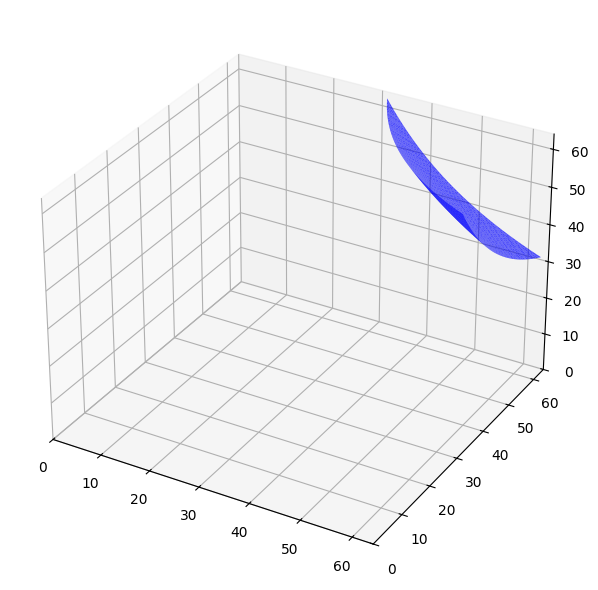

In [204]:
# ST3D.inverse(ST3D(x)).shape
viz(tf.squeeze(ST3D.inverse(ST3D(x))).numpy())

In [ ]:
isequal = lambda a,b:np.allclose(a, b, rtol=1e-7, atol=1e-7)
isequal(ST3D.inverse(ST3D(x)), x)

True

        tf version of Vineet's code !! deprecated

In [381]:
import numpy as np
import pywt
from scipy.signal import freqz
import matplotlib.pyplot as plt
import time
import math


class ShearletTransform3D:
    def __init__(self, N, J, L=None, B=None, a=None, norm=False, wave='db3'):
        """
        args
        N
        J
        L: array of +ve integers of length J 
        B
      
        note end"""
        # def v(x):
        #     return np.piecewise(x, [x<=0, x>=1], [0, 1, lambda x: x**3*(10-15*x+6*x**2)])  # 3 vanishing moments
        #     # return np.piecewise(x, [x<=0, x>=1], [0, 1, lambda x: x**4*(35-84*x+70*x**2-20*x**3)])  # 4 vanishing moments
        def v(x):
            # Ensure x is a float tensor
            # x = tf.convert_to_tensor(x, dtype=tf.float64)
            # Conditions
            cond0 = x <= 0
            cond1 = x >= 1
            # Polynomial part for 0 < x < 1
            x_poly = x**3 * (10 - 15 * x + 6 * x**2)
            return tf.where(cond0, 0.0, tf.where(cond1, 1.0, x_poly))

        # def phi(x):
        #     x = 1/np.pi*np.abs(x)
        #     return np.piecewise(x, [x<=1, np.logical_and(x>1, x<2)], [1, lambda x: np.cos(0.5*np.pi*v(x-1)), 0])
        def phi(x):
            x = tf.convert_to_tensor(x, dtype=tf.float64)
            x = tf.abs(x) / tf.constant(np.pi, dtype=tf.float64)

            cond1 = x <= 1
            cond2 = tf.logical_and(x > 1, x < 2)

            part1 = tf.ones_like(x)
            part2 = tf.cos(0.5 * np.pi * v(x - 1))
            part3 = tf.zeros_like(x)

            return tf.where(cond1, part1, tf.where(cond2, part2, part3)).numpy()
        
        # def W(x, ljbj, ljbj_1):
            # return np.sqrt(np.square(phi(x/ljbj))-np.square(phi(x/ljbj_1)))
        def W(x, ljbj, ljbj_1):
            return tf.math.sqrt(tf.math.square(phi(x/ljbj))-tf.math.square(phi(x/ljbj_1))).numpy()
        
        # def V(x):
        #     if False:
        #         return np.piecewise(x, [np.logical_and(x>-1, x<1)], [lambda x: np.sqrt(v(1-np.abs(x))), 0])
        #     else:
        #         x = np.pi*x
        #         # wavelet = pywt.Wavelet('db3')
        #         wavelet = pywt.Wavelet(wave)
        #         h0 = wavelet.dec_lo
        #         # print('_', np.clip(x, -np.pi, np.pi).shape)
        #         return np.abs(freqz(h0/np.sqrt(2), worN=np.clip(x, -np.pi, np.pi))[1])
        def V(x):
            if wave==None:
                return piecewise_fn(x)                
            else:
                return freqz_abs(x)
                wavelet = pywt.Wavelet(wave)  #
                h0 = wavelet.dec_lo 
                return freqz_abs(x, h0)          #
        # @tf.function
        def piecewise_fn(x):
            # x = tf.convert_to_tensor(x, dtype=tf.float32)
            cond = tf.logical_and(x > -1, x < 1)
            val = tf.sqrt(v(1.0 - tf.abs(x)))
            return tf.where(cond, val, tf.zeros_like(x)).numpy()
        # @tf.function
        def freqz_abs(x1):
            # Ensure high precision: float64 and complex128
            # h0 = tf.convert_to_tensor(h0, dtype=tf.complex128)
            x1 = np.pi*x1
            
            # ### move out of function
            wavelet = pywt.Wavelet(wave)  #
            h0 = wavelet.dec_lo           #
            
            h0 = h0 / tf.sqrt(tf.constant(2.0, dtype=tf.float64))
            h0 = tf.cast(h0, tf.complex128)

            x1 = tf.cast(x1, tf.float64)
            x1_clipped = tf.clip_by_value(x1, -tf.constant(tf.constant(np.pi, dtype=tf.float64)), tf.constant(np.pi, dtype=tf.float64))
            freqs = tf.reshape(x1_clipped, [-1])  # [M]

            n = tf.range(tf.shape(h0)[0], dtype=tf.float64)  # [L]
            n = tf.reshape(n, [1, -1])                      # [1, L]
            freqs = tf.reshape(freqs, [-1, 1])              # [M, 1]

            exponent = tf.exp(-1j * tf.cast(freqs * n, tf.complex128))  # [M, L]
            response = tf.matmul(exponent, tf.reshape(h0, [-1, 1]))     # [M, 1]
            response_abs = tf.abs(response)                             # [M, 1]

            return tf.cast(tf.reshape(response_abs, tf.shape(x1)), dtype=tf.float64).numpy()
            
        def centered_wrap(x, half_modulo=np.pi):
            return (x+half_modulo)%(2*half_modulo)-half_modulo
        
        # def downsample(x, fac=2):
        #     return sum(np.split(sum(np.split(sum(np.split(x, fac, -1)), fac, -2)), fac, -3))
        def downsample_tf(x, fac=2):
            return tf.add_n(
                tf.split(
                    tf.add_n(
                        tf.split(
                            tf.add_n(
                                tf.split(x, fac, axis=-1)
                            ), fac, axis=-2
                        )
                    ), fac, axis=-3
                )
            ).numpy()

        # @tf.function
        def get_shearlet_system():
            # filerbank='analysis'
            # if filterbank=='analysis':
                # V = 
            shearlet_system = [[], [], [], []]
            # temp = centered_wrap(np.linspace(0, 2*np.pi, N, endpoint=False), np.pi)
            # w = np.stack(np.meshgrid(temp, temp, temp, copy=False, indexing='ij'), axis=0)
            temp = centered_wrap((tf.range(N, dtype=tf.float64) * (2.0 * math.pi / N)), math.pi)
            w = tf.stack(tf.meshgrid(temp, temp, temp, indexing='ij'), axis=0)
            
            temp = tf.math.abs(w)
            # print(f"{np.logical_and(temp[1]<=temp[0], temp[2]<=temp[0]).dtype} \n{np.logical_and(temp[1]<=temp[0], temp[2]<=temp[0]).dtype}")
            XP0 = tf.logical_and(temp[1]<=temp[0], temp[2]<=temp[0]).numpy()
            XP1 = tf.logical_and(temp[0]<temp[1], temp[2]<=temp[1]).numpy()
            XP2 = tf.logical_and(temp[0]<temp[2], temp[1]<temp[2]).numpy()

            w0 = w[0, :, :1, :1]
            shearlet = phi((L[J-1]*B[J-1])*w0)
            shearlet = shearlet*XP0 + tf.transpose(shearlet, perm=[1, 0, 2])*XP1 + tf.transpose(shearlet, perm=[1, 2, 0])*XP2
            shearlet_system[0].append(shearlet)
            
            temp = w[0, :, :, :1]
            # ratio = tf.math.divide(w[1, :, :, :1], temp, out=np.full_like(temp, np.inf), where=temp!=0).numpy()
            ratio = np.divide(w[1, :, :, :1], temp, out=np.full_like(temp, np.inf), where=temp!=0) ## -----totf


            for j in range(J):
                W0 = W(w0, (L[j]*B[j])/(L[J-1]*B[J-1]), (1 if j==0 else L[j-1]*B[j-1])/(L[J-1]*B[J-1]))
                W1 = tf.transpose(W0, perm=[1, 0, 2])*XP1
                W2 = tf.transpose(W0, perm=[1, 2, 0])*XP2
                W0 = W0*XP0
                temp = L[j]*ratio

                for l1 in range(-L[j], L[j]+1):
                    shear1 = V(temp-l1)
                    for l2 in range(-L[j], L[j]+1):
                        shearlet = shear1*tf.transpose(V(temp-l2), perm=[0, 2, 1])
                        if abs(l1)==L[j]:
                            shearlet_ = shear1*tf.transpose(V(temp+l2), perm=[0, 2, 1]) if l1<0 else shearlet
                            if abs(l2)==L[j]:
                                shearlet__ = V(temp+l1)*tf.transpose(V(temp-l2),perm=[0, 2, 1]) if l2<0 else shearlet
                                shearlet = shearlet*W0 + tf.transpose(shearlet_, perm=[1, 0, 2])*W1 + tf.transpose(shearlet__,perm=[2, 1, 0])*W2
                                shearlet_system[3].append(shearlet)
                            else:
                                shearlet = shearlet*W0 + tf.transpose(shearlet_, perm=[1, 0, 2])*W1
                                shearlet_system[2].append(shearlet)
                        elif abs(l2)!=L[j]:
                            shearlet = shearlet*W0
                            shearlet_system[1].append(shearlet)
            for i in range(4):
                shearlet_system[i] = tf.stack(shearlet_system[i], axis=0)
            return shearlet_system

        # if a is not None:
        #     L = [int(np.round(a**(2/3*j))) for j in range(J)]
        #     B = [a**(j+1)/L[j] for j in range(J)]
        if a is not None:
            L = [int(tf.math.round(a**(2/3*j))) for j in range(J)]
            B = [a**(j+1)/L[j] for j in range(J)]

        self.N = N
        self.J = J
        self.L = L
        self.B = B
        self.norm = norm
        self.shearlet_system = get_shearlet_system()
        
        # if self.norm:
            # self.norm_factors = [np.sum(np.square(np.abs(filters)), axis=(-3, -2, -1), keepdims=True) for filters in self._yield_filters()]
            # self.norm_factors = np.concatenate(self.norm_factors, axis=-4)
            # self.norm_factors = np.sqrt(N**3/self.norm_factors)
        if self.norm:
            self.norm_factors = [tf.reduce_sum(tf.math.square(tf.math.abs(filters)), axis=(-3, -2, -1), keepdims=True) for filters in self._yield_filters()]
            self.norm_factors = tf.concat(self.norm_factors, axis=-4)
            self.norm_factors = tf.math.sqrt(N**3/self.norm_factors)
                      

    # def _yield_filters(self):
    #     yield self.shearlet_system[0]
    #     yield self.shearlet_system[1]
    #     yield self.shearlet_system[1].transpose(0, 2, 3, 1)
    #     yield self.shearlet_system[1].transpose(0, 3, 1, 2)
    #     yield self.shearlet_system[2]
    #     yield self.shearlet_system[2].transpose(0, 2, 3, 1)
    #     yield self.shearlet_system[2].transpose(0, 3, 1, 2)
    #     yield self.shearlet_system[3]
    def _yield_filters(self):
        yield self.shearlet_system[0]
        yield self.shearlet_system[1]
        yield tf.transpose(self.shearlet_system[1], perm=[0, 2, 3, 1])
        yield tf.transpose(self.shearlet_system[1], perm=[0, 3, 1, 2])
        yield self.shearlet_system[2]
        yield tf.transpose(self.shearlet_system[2], perm=[0, 2, 3, 1])
        yield tf.transpose(self.shearlet_system[2], perm=[0, 3, 1, 2])
        yield self.shearlet_system[3]
    def _yield_filter_bank_tensor(self):
        FB = [
            self.shearlet_system[0],
            self.shearlet_system[1],
            tf.transpose(self.shearlet_system[1], perm=[0, 2, 3, 1]),
            tf.transpose(self.shearlet_system[1], perm=[0, 3, 1, 2]),
            self.shearlet_system[2],
            tf.transpose(self.shearlet_system[2], perm=[0, 2, 3, 1]),
            tf.transpose(self.shearlet_system[2], perm=[0, 3, 1, 2]),
            self.shearlet_system[3]
        ]
        return tf.cast(tf.concat(FB, axis=0), tf.complex64)
    
        
    def _filtering(self, y, filters):
        filters = tf.cast(filters, tf.complex128)
        # print(y.dtype, filters.dtype)
        y = y*filters
        # y = np.fft.ifftn(y, axes=(-3, -2, -1))
        y = tf.signal.ifft3d(y) 
        return y

        
    # def __call__(self, x):
    #     y = np.fft.fftn(x, [self.N]*3)
    #     y = np.expand_dims(y, axis=-4)
    #     filtered = []
    #     for filters in self._yield_filters():
    #         temp = self._filtering(y, filters)
    #         filtered.append(temp)
    #     filtered = np.concatenate(filtered, axis=-4)
    #     filtered = filtered[..., :x.shape[-3], :x.shape[-2], :x.shape[-1]]
    #     if self.norm:
    #         filtered *= self.norm_factors
    #     return filtered
    # UPDATE 1
    def __call__(self, x):
        y = tf.signal.fft3d(tf.cast(x, dtype=tf.complex128))
        # y = np.fft.fftn(x, [self.N]*3)
        y = np.expand_dims(y, axis=-4)
        filtered = []
        for filters in self._yield_filters():
            temp = self._filtering(y, filters)
            filtered.append(temp)
        # filtered = np.concatenate(filtered, axis=-4)
        filtered = tf.concat(filtered, axis=-4)
        filtered = filtered[..., :x.shape[-3], :x.shape[-2], :x.shape[-1]]
        if self.norm:
            self.norm_factors = tf.cast(self.norm_factors, tf.complex128)
            print(filtered.dtype, self.norm_factors.dtype)
            filtered *= self.norm_factors
        return filtered
    ## UPDATE 2!!
    # def __call__(self, x):
    #     x = tf.signal.fft3d(tf.cast(x, dtype=tf.complex128))
    #     xfft = tf.signal.fft3d(x)
    #     # xfft = tf.expand_dims(xfft, axis=-4)
    #     FB = self._yield_filter_bank_tensor()
    #     FB = tf.cast(FB, tf.complex128)
    #     # return xfft, FB
    #     # print(xfft.shape, FB.shape, xfft.dtype, FB.dtype)
    #     # # (1, 128, 128, 128) (63, 128, 128, 128)
    #     filtered = tf.einsum('ijk,fijk->fijk', xfft, FB)
    #     filtered = tf.signal.ifft3d(filtered )
    #     # filtered = filtered[..., :x.shape[-3], :x.shape[-2], :x.shape[-1]]
    #     if self.norm:
    #         self.norm_factors = tf.cast(self.norm_factors, dtype=tf.complex128)
    #         filtered *= self.norm_factors
    #     return filtered
        
    def forward(self, x):
        return self(x)
   
        

        
    def _synthesis(self, y, idx, filters):
        filters = tf.cast(filters, tf.complex128)
        y = y[..., idx:idx+filters.shape[0], :, :, :]
        y = tf.signal.fft3d(y)
        y = y*filters
        y = tf.reduce_sum(y, axis=-4)
        return y, idx+filters.shape[0]
        
    def inverse(self, y):
        if self.norm:
            y = y/self.norm_factors
        synthesized = 0
        idx = 0
        for filters in self._yield_filters():
            temp, idx = self._synthesis(y, idx, filters)
            synthesized += temp
        # synthesized = np.fft.ifftn(synthesized, axes=(-3, -2, -1))
        synthesized = tf.cast(synthesized, tf.complex128)
        synthesized = tf.signal.ifft3d(synthesized)#, axes=(-3, -2, -1))
        synthesized = synthesized[..., :y.shape[-3], :y.shape[-2], :y.shape[-1]]
        return synthesized


start_time = time.time()
# ST3D = ShearletTransform3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True)
ST3D = ShearletTransform3D(N=32, J=2, L=[1, 2], B=[4, 8], norm=True, wave='db6')
# ST3D = ShearletTransform3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True, wave='db15')

# ST3D = ShearletTransform3D(N=32, J=3, L=[1, 4, 8], B=[6, 8, 10], norm=True, wave='db20')
print(time.time()-start_time)

print(ST3D)
## get the shearlet system
sys3d = ST3D.shearlet_system
len(sys3d), type(sys3d)
np.squeeze(sys3d[0]).shape
print([_.shape for _ in sys3d])
[_.dtype for _ in sys3d]

# s = np.random.randint(_[1].shape[0])
# s=0 #override!!
# print(s)
# _ = _[1][2,...]
# viz(np.squeeze()), plt.title(s)

0.18544363975524902
[TensorShape([1, 32, 32, 32]), TensorShape([10, 32, 32, 32]), TensorShape([8, 32, 32, 32]), TensorShape([8, 32, 32, 32])]


[tf.float64, tf.float64, tf.float64, tf.float64]

In [399]:
# ST3D(x)
# xfft_, FB_ = ST3D(x)
# FB_.shape ,xfft_.shape, FB_.dtype, xfft_.dtype

In [400]:
# tf.einsum('fijk,ijk->fijk', tf.cast(FB_, tf.float32), tf.cast(xfft_, tf.float32))
# tf.einsum('fijk,ijk->fijk', FB_, xfft_)


        visualize

    shearlet transform of a sample x

Volume range: 0.000 to 250047.000 — using level=125023.500


<tf.Tensor: shape=(), dtype=float64, numpy=2.7426952225178872e-06>

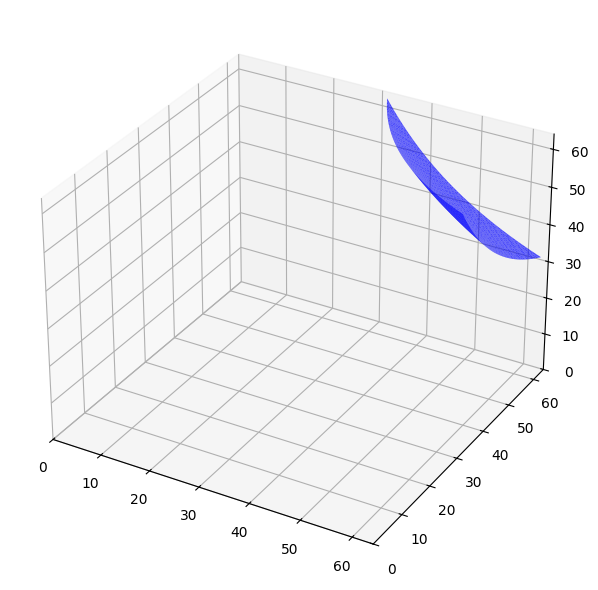

In [49]:
n = 64
axis1 = np.arange(0,n)
x = np.einsum('i,j->ij', axis1, axis1)
x = np.einsum('i,j,k->ijk', axis1, axis1, axis1)
viz(x)
tf.reduce_sum(tf.abs(ST3D.inverse(ST3D(x)) - x))

Volume range: -0.000-0.000j to 250047.000-0.000j — using level=125023.500-0.000j


/data1/kishoretarafdar/miniforge3/envs/tf218/lib/python3.12/site-packages/skimage/measure/_marching_cubes_lewiner.py:171: ComplexWarning: Casting complex values to real discards the imaginary part
  volume = np.ascontiguousarray(volume, np.float32)  # no copy if not necessary
/data1/kishoretarafdar/miniforge3/envs/tf218/lib/python3.12/site-packages/skimage/measure/_marching_cubes_lewiner.py:178: ComplexWarning: Casting complex values to real discards the imaginary part
  level = float(level)


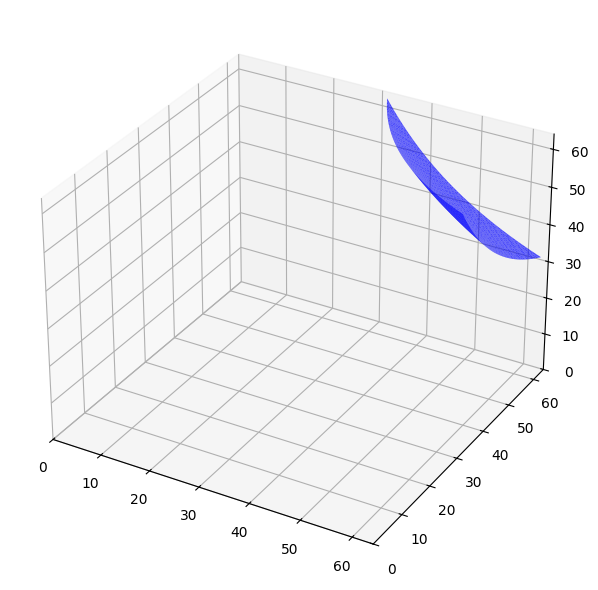

In [50]:
# viz(ST3D.inverse(ST3D(x)).numpy())
viz(tf.squeeze(ST3D.inverse(ST3D(x))).numpy())

In [ ]:
viz(ST3D.inverse(ST3D(x)).numpy())

In [154]:
def stack_all_shearlet_filters_for_transform(shearlet_system):
    system = [
        shearlet_system[0],
        shearlet_system[1],
        shearlet_system[1].transpose(0, 2, 3, 1),
        shearlet_system[1].transpose(0, 3, 1, 2),
        shearlet_system[2],
        shearlet_system[2].transpose(0, 2, 3, 1),
        shearlet_system[2].transpose(0, 3, 1, 2),
        shearlet_system[3]
    ]
    return tf.concat(system, axis=0)

dstsys = stack_all_shearlet_filters_for_transform(sys3d)
# [el.shape for el in __]
dstsys.shape

TensorShape([63, 32, 32, 32])

In [119]:
# x.dtype

dtype('int64')

In [198]:
a = np.fft.fftn(x, [n]*3) 
b = tf.signal.fft3d(tf.cast(x, tf.complex64))
np.allclose(a, b.numpy(), rtol=1e-4, atol=1e-9)


True

In [199]:
a.shape,b.shape, a.dtype

((32, 32, 32), TensorShape([32, 32, 32]), dtype('complex128'))

Volume range: -12962582.268 to 122023936.000 — using level=54530676.866


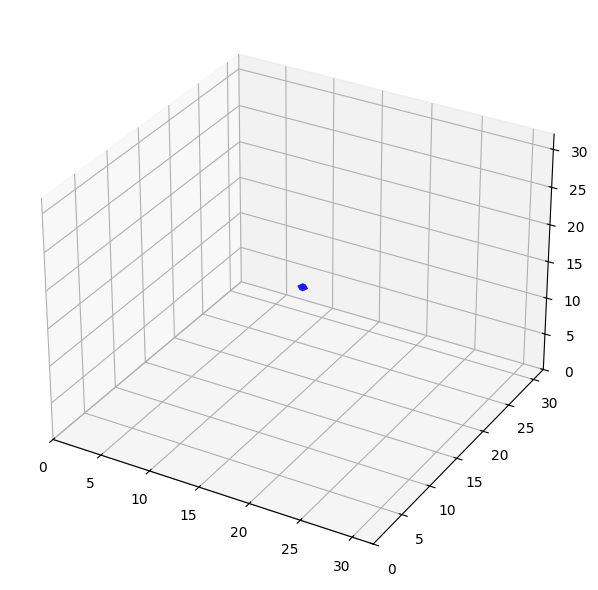

In [152]:
viz(tf.math.real(tf.signal.ifftshift(a)).numpy())

In [177]:
x.shape, dstsys.shape, x.dtype, dstsys.dtype

((32, 32, 32), TensorShape([63, 32, 32, 32]), dtype('int64'), tf.float64)

In [195]:
# tf.transpose(dstsys, perm=[])
def foo(x):
    hfft = tf.cast(dstsys, tf.complex64) #!!remove later
    xfft = tf.signal.fft3d(tf.cast(x, tf.complex64))
    yfft = tf.einsum('ijk,cijk->cijk', xfft, hfft)
    # y = tf.signal.ifft3d(yfft)
    yfft = np.fft.ifftn(yfft, axes=(-3, -2, -1))
    print('y', yfft.shape, tf.reduce_sum(tf.math.imag(yfft)).numpy())
    # if norm:
    norm_factors = get_normalize_factor()
    print(norm_factors.shape)
    yfft = yfft[..., :x.shape[-3], :x.shape[-2], :x.shape[-1]]
    yfft *= norm_factors
    print(yfft.shape)
    return tf.math.real(y)
y = foo(x)
y.shape

y (63, 32, 32, 32) 0.00332354
(63, 1, 1, 1)
(63, 32, 32, 32)


TensorShape([63, 32, 32, 32])

In [160]:
sys3d.shape

AttributeError: 'list' object has no attribute 'shape'

In [165]:
[_.shape for _ in sys3d]

[(1, 32, 32, 32), (10, 32, 32, 32), (8, 32, 32, 32), (8, 32, 32, 32)]

In [265]:
# if self.norm:
N = n
def get_normalize_factor():
    norm_factors = [np.sum(np.square(np.abs(filters)), axis=(-3, -2, -1), keepdims=True) for filters in _yield_filters()]
    norm_factors = np.concatenate(norm_factors, axis=-4)
    norm_factors = np.sqrt(N**3/norm_factors)
    return norm_factors
            
def _yield_filters():
    shearlet_system = sys3d
    yield shearlet_system[0]
    yield shearlet_system[1]
    yield shearlet_system[1].transpose(0, 2, 3, 1)
    yield shearlet_system[1].transpose(0, 3, 1, 2)
    yield shearlet_system[2]
    yield shearlet_system[2].transpose(0, 2, 3, 1)
    yield shearlet_system[2].transpose(0, 3, 1, 2)
    yield shearlet_system[3]
    
def _filtering(y, filters):
    y = y*filters
    y = np.fft.ifftn(y, axes=(-3, -2, -1))
    return y

def call(x):
    # y = np.fft.fftn(x, [self.N]*3)
    y = tf.signal.fft3d(tf.cast(x, tf.complex64))
    y = tf.expand_dims(y, axis=-4)
    filtered = []
    for filters in _yield_filters():
        temp = _filtering(y, filters)
        print(temp.shape)
        filtered.append(temp)
    filtered = tf.concat(filtered, axis=-4)
    _ = filtered
    print(filtered.shape)
    filtered = filtered[..., :x.shape[-3], :x.shape[-2], :x.shape[-1]]
    print(filtered.shape, x.shape)
    print(np.allclose(filtered.numpy(), _.numpy(), rtol=1e-4, atol=1e-2))
    # if norm:
    norm_factors = get_normalize_factor()
    print(norm_factors.shape)
    filtered *= norm_factors
    return filtered
yvin = call(x)
yvin.shape

(1, 32, 32, 32)
(10, 32, 32, 32)
(10, 32, 32, 32)
(10, 32, 32, 32)
(8, 32, 32, 32)
(8, 32, 32, 32)
(8, 32, 32, 32)
(8, 32, 32, 32)
(63, 32, 32, 32)
(63, 32, 32, 32) (32, 32, 32)
True
(63, 1, 1, 1)


TensorShape([63, 32, 32, 32])

In [268]:
def _synthesis(y, idx, filters):
    y = y[..., idx:idx+filters.shape[0], :, :, :]
    y = tf.signal.fft3d(y).numpy()
    y = y*filters
    y = tf.reduce_sum(y, axis=-4)
    return y, idx+filters.shape[0]
    
def inverse(y):
    # if self.norm:
    norm_factors = get_normalize_factor()
    y = y/norm_factors
    synthesized = 0
    idx = 0
    for filters in _yield_filters():
        temp, idx = _synthesis(y, idx, filters)
        synthesized += temp
    synthesized = tf.signal.ifft3d(synthesized)
    synthesized = synthesized[..., :y.shape[-3], :y.shape[-2], :y.shape[-1]]
    return synthesized


xvin = inverse(yvin)
xvin.shape, xvin.dtype#np.sum(np.imag(xvin))

(TensorShape([32, 32, 32]), tf.complex128)

In [269]:
print(np.allclose(x, xvin, rtol=1e-1, atol=1e-1))

True


In [230]:
isequal = lambda a,b:np.allclose(a, b, rtol=1e-2, atol=1e-2)
isequal(ST3D.inverse(ST3D(x)), x)

True

In [ ]:
# tf.signal.fftshift(tf.signal.fft2d(tf.signal.ifftshift(tf.cast(coeffs[...,j],tf.complex128))))

In [196]:
y

<tf.Tensor: shape=(63, 32, 32, 32), dtype=float32, numpy=
array([[[[ 3.04862500e+03,  2.63620459e+03,  2.24771362e+03, ...,
           4.27003662e+03,  3.88154492e+03,  3.46912476e+03],
         [ 2.63620508e+03,  2.27957739e+03,  1.94364136e+03, ...,
           3.69238281e+03,  3.35644678e+03,  2.99981909e+03],
         [ 2.24771338e+03,  1.94364136e+03,  1.65721155e+03, ...,
           3.14824512e+03,  2.86181494e+03,  2.55774268e+03],
         ...,
         [ 4.27003613e+03,  3.69238281e+03,  3.14824487e+03, ...,
           5.98079883e+03,  5.43666064e+03,  4.85900635e+03],
         [ 3.88154492e+03,  3.35644702e+03,  2.86181519e+03, ...,
           5.43666064e+03,  4.94202881e+03,  4.41693066e+03],
         [ 3.46912500e+03,  2.99981934e+03,  2.55774292e+03, ...,
           4.85900684e+03,  4.41693066e+03,  3.94762451e+03]],

        [[ 2.63620483e+03,  2.27957715e+03,  1.94364136e+03, ...,
           3.69238306e+03,  3.35644678e+03,  2.99981909e+03],
         [ 2.27957739e+03,  1.

In [197]:
yvin

<tf.Tensor: shape=(63, 32, 32, 32), dtype=complex64, numpy=
array([[[[ 1.06205523e+05+0.00000000e+00j,
           9.18379531e+04+0.00000000e+00j,
           7.83040234e+04+0.00000000e+00j, ...,
           1.48756078e+05+8.50517303e-03j,
           1.35222109e+05+0.00000000e+00j,
           1.20854555e+05-4.25258651e-03j],
         [ 9.18379766e+04+4.25258651e-03j,
           7.94140703e+04+0.00000000e+00j,
           6.77110000e+04+2.12629326e-03j, ...,
           1.28632234e+05+8.50517303e-03j,
           1.16929172e+05+0.00000000e+00j,
           1.04505266e+05+0.00000000e+00j],
         [ 7.83040156e+04+0.00000000e+00j,
           6.77110000e+04+0.00000000e+00j,
           5.77325898e+04+0.00000000e+00j, ...,
           1.09676008e+05+8.50517303e-03j,
           9.96975859e+04+0.00000000e+00j,
           8.91045625e+04-4.25258651e-03j],
         ...,
         [ 1.48756047e+05+0.00000000e+00j,
           1.28632234e+05+2.12629326e-03j,
           1.09676000e+05+2.12629326e-03j, ...,


In [202]:
np.allclose(y.numpy(), yvin.numpy(), rtol=1e-1, atol=1e-2)

False

In [256]:
isequal(x, tf.signal.ifft3d(tf.signal.fft3d(x)))


True


updates

----




# batched multichannel DST and IDST

In [50]:
# # # include ../dirx 
# mylibpath = [
#     '/data1/kishoretarafdar/src.port/DST.v0/shearlet.layers'
#     ]
# import sys
# [sys.path.insert(0,_) for _ in mylibpath]
# del mylibpath
# from ShearletTransform3Dv01 import ShearletTransform3D
# import time

# class DST3D(ShearletTransform3D):
#     def __init__(self, transform=None, **kwargs):#, l1=0.0, l2=0.0):
#         super(DST3D, self).__init__(**kwargs)
#         self.transform = transform
    
#     ## UPDATE applied for batched multichannel inputs
#     def forward(self, x):
#         x = tf.cast(x, dtype=tf.complex128)
#         FB = self._yield_filter_bank_tensor()
#         x = tf.transpose(x, perm=[0,4,1,2,3])
#         xfft = tf.signal.fft3d(x)
#         filtered = tf.einsum('bcijk,fijk->bcfijk', xfft, FB)
#         filtered = tf.signal.ifft3d(filtered)
#         if self.norm:
#             self.norm_factors = tf.cast(self.norm_factors, dtype=tf.complex128)
#             filtered *= self.norm_factors
#             # filtered = tf.einsum('bcfijk,fijk->bcfijk', filtered, self.norm_factors)
#         return filtered
    
#     def call(self, x):
#         if self.transform==None:
#             return self.forward(x)
#         elif self.transform=='inverse':
#             return self.inverse(x)
#         else:
#             raise ValueError(f"Unknown key {transform}!! keys 'None' (default) or 'inverse' only allowed")

#     def inverse(self, y):
#         y = tf.cast(y, tf.complex128)
#         self.norm_factors = tf.cast(self.norm_factors, tf.complex128)
#         if self.norm:
#             y = y/self.norm_factors
#             # y = tf.einsum('bcfijk,fijk->bcfijk', y, 1/self.norm_factors)      
#         yfft = tf.signal.fft3d(y)
#         if 'bio' in self.wave:
#             FB = self._yield_filter_bank_tensor_rec()
#         else:
#             FB = self._yield_filter_bank_tensor()
#         synthesized = tf.einsum('bcfijk,fijk->bcijk', yfft, FB)
#         synthesized = tf.cast(synthesized, tf.complex128)
#         synthesized = tf.signal.ifft3d(synthesized)#, axes=(-3, -2, -1))
#         synthesized = tf.transpose(synthesized, perm=[0,2,3,4,1])
#         return tf.math.real(synthesized)


# start_time = time.time()
# # ST3D = ShearletTransform3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True)
# # ST3D = ShearletTransform3D(N=32, J=2, L=[1, 2], B=[4, 8], norm=True, wave='db6')
# ST3D = DST3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True, wave='bior1.5')

# # ST3D = ShearletTransform3D(N=32, J=3, L=[1, 4, 8], B=[6, 8, 10], norm=True, wave='db20')
# print(time.time()-start_time)
     

In [51]:
# import numpy as np
# n = 64
# axis1 = np.arange(0,n)
# x = np.einsum('i,j->ij', axis1, axis1)
# x = np.einsum('i,j,k->ijk', axis1, axis1, axis1)
# xx = tf.expand_dims(tf.expand_dims(x, axis=-1), axis=0)
# xx = tf.concat([xx,xx, xx], axis=-1)
# xx.shape
# # viz(x)
# dst3D = DST3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='rbio1.5')
# dst3D.forward(xx).shape
# xxrec = dst3D.inverse(dst3D(xx))
# xxrec.dtype, xxrec.shape
# print(f"\nReconstruction error: {tf.reduce_sum(tf.abs(xxrec - tf.cast(xx,dtype=tf.float64)))}\n")

In [9]:
c = 2
input_shape = (n,n,n,c)
inputs = tf.keras.Input(input_shape)

H  = DST3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='bior1.5')
Hr = DST3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='bior1.5', transform='inverse')
q = H(inputs)
outputs = Hr(q)
# outputs = q
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.summary()

[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 64, 64, 64, 2)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dst3d_3 (DST3D)                 │ (None, 2, 63, 64, 64,  │             0 │
│                                 │ 64)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dst3d_4 (DST3D)                 │ (None, 64, 64, 64, 2)  │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [224]:
c = 2
input_shape = (c,63,n,n,n)
inputs = tf.keras.Input(input_shape)

# H  = DST3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='bior1.5')
Hr = DST3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='bior1.5', transform='inverse')
q = Hr(inputs)
# outputs = Hr(q)
outputs = q
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.summary()

[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_26 (InputLayer)     │ (None, 2, 63, 64, 64,  │             0 │
│                                 │ 64)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dst3d_14 (DST3D)                │ (None, 64, 64, 64, 2)  │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

## LAYER: Shearlet Fusion 

        exported to py file ShearletFusion3Dv001.py

In [49]:
import tensorflow as tf
# # include ../dirx 
mylibpath = [
    '/data1/kishoretarafdar/src.port/DST.v0/shearlet.layers'
    ]
import sys
[sys.path.insert(0,_) for _ in mylibpath]
del mylibpath

from ShearletFusion3Dv001 import ShearletFusion3D
start_time = time.time()
# ST3D = ShearletTransform3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True)
# ST3D = ShearletTransform3D(N=32, J=2, L=[1, 2], B=[4, 8], norm=True, wave='db6')
ST3D = ShearletFusion3D(N=128, J=2, L=[1, 2], B=[4, 8], norm=True, wave='bior1.5')

# ST3D = ShearletTransform3D(N=32, J=3, L=[1, 4, 8], B=[6, 8, 10], norm=True, wave='db20')
print(time.time()-start_time)
del ST3D 

## Example
import numpy as np
n = 64
axis1 = np.arange(0,n)
x = np.einsum('i,j->ij', axis1, axis1)
x = np.einsum('i,j,k->ijk', axis1, axis1, axis1)
xx = tf.expand_dims(tf.expand_dims(x, axis=-1), axis=0)
xx = tf.concat([xx,xx, xx], axis=-1)
xx.shape
# viz(x)
dst3D = ShearletFusion3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='rbio1.5')
dst3D.forward(xx).shape
xxrec = dst3D.inverse(dst3D.forward(xx))
xxrec.dtype, xxrec.shape
print(f"\nReconstruction error: {tf.reduce_sum(tf.abs(xxrec - tf.cast(xx,dtype=tf.float64)))}\n")

## Example
# Define input shape and build the model for summary
# input_shape = (16,16, 2)  # Replace N with the actual size of x
n = 64
input_shape = (n, n, n, 12)
inputs = tf.keras.Input(shape=input_shape, dtype=tf.float32)

# Create an instance of the custom layer
H = ShearletFusion3D(N=n, J=2, L=[1, 2], B=[4, 8], norm=True, wave='bior1.5')

# Apply the custom layer to the inputs
outputs = H(inputs)

# Build the model
model = tf.keras.Model(inputs=inputs, outputs=outputs)

# Print the model summary
model.summary()

[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]
1.2180960178375244
[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]
(63, 1, 1, 1) (1, 3, 63, 64, 64, 64) ++
(63, 1, 1, 1) (1, 3, 63, 64, 64, 64) ++

Reconstruction error: 49161240576.0

[tf.float64, tf.float64, tf.float64, tf.float64]
[tf.float64, tf.float64, tf.float64, tf.float64]
(63, 1, 1, 1) (None, 12, 63, 64, 64, 64) ++


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 64, 64, 64, 12) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ shearlet_fusion3d_37            │ (None, 64, 64, 64, 1)  │             0 │
│ (ShearletFusion3D)              │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)